In [20]:
from ast import literal_eval

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import sys

sys.path.append("..")
from utils.helpers import configure_seaborn, running_avg
import pandas as pd
configure_seaborn()

N runs: 1


/home/lam/anaconda3/envs/moo/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


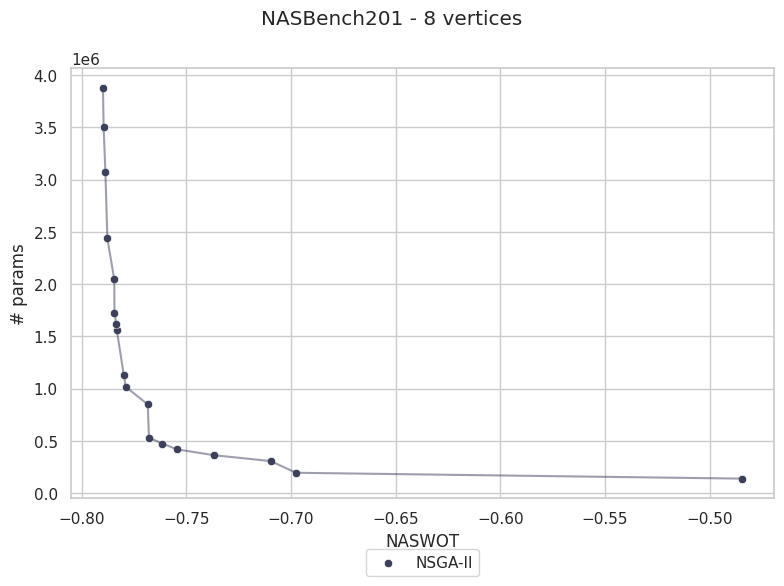

In [21]:
from pymoo.util.nds.non_dominated_sorting import NonDominatedSorting

PROBLEM = ("8")

caption_dict = {
    "NSGAII": "NSGA-II",
    # "Pareto-RS": "Pareto-Random Search",
    # "3RD": "Pareto-NRPA with policy reassignment",
    # "Oriented-NRPA" : "Oriented-NRPA",
    # "Oriented-NRPA2" : "Oriented-NRPA2"
}

# df_baseline = pd.read_csv(f"results/nsga2_tsptw_moo_{PROBLEM}.csv")
# df_uct = pd.read_csv(f"results/uct_tsptw_moo_{PROBLEM}.csv")
df_1 = pd.read_csv(f"results/radar_{PROBLEM}.csv")
# df_1 = pd.concat([df_baseline, df_1])
algos = np.unique(df_1["algorithm"])
df_1["objective_1l"] = np.log(df_1["objective_1"])
df_1["objective_2l"] = np.log(df_1["objective_2"])

print(f"N runs: {len(df_1['run'].unique())}")
f, ax = plt.subplots(1, 1, figsize=(8, 6), constrained_layout = False)
for i, alg_name in enumerate(algos):
    # if alg_name in ["Pareto-RS", "Pareto-NRPA_2pol", "Slice-NRPA"]: continue
    if alg_name not in ["NSGAII", "Pareto-NRPA", "Slice-NRPA", "3RD"]: continue
    if alg_name not in caption_dict.keys():
        caption_dict[alg_name] = alg_name
    position = list(caption_dict.keys()).index(alg_name)
    df_filtered = df_1[df_1["algorithm"] == alg_name].sort_values("objective_2")
    F = df_filtered[["objective_1", "objective_2"]].values
    nds = NonDominatedSorting()
    fronts = nds.do(F, only_non_dominated_front=False)
    values = df_filtered.iloc[fronts[0]]
        # plt.scatter(F[front][:, 0], F[front][:, 1], label=caption_dict[alg_name], alpha=0.5,
    # color=sns.color_palette()[position])
    sns.scatterplot(values, x="objective_1", y="objective_2", label=caption_dict[alg_name], ax=ax, color=sns.color_palette()[position])
    plt.plot(values["objective_1"], values["objective_2"], alpha=0.5, color=sns.color_palette()[position])
plt.legend(bbox_to_anchor=(0.5, -0.1), loc='upper center', ncol=2)
ax.set_xlabel("NASWOT")
ax.set_ylabel("# params")
f.suptitle(f"NASBench201 - {PROBLEM} vertices")
plt.tight_layout()
plt.show()


In [7]:
from utils.helpers import normalize

df_1["sum"] = normalize(df_1["objective_1"])**2 + normalize(df_1["objective_2"])**2
u = df_1[df_1["algorithm"] == "NSGAII"]
display(u.loc[u["objective_2"] == u["objective_2"].min()])
display(u.loc[u["objective_1"] == u["objective_1"].min()])
display(u.loc[u["sum"] == u["sum"].min()])

,Unnamed: 0,algorithm,run,sequence,objective_1,objective_2,policy,objective_1l,objective_2l,sum
17,17,NSGAII,0,"[0, 2, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, ...",-0.484464,139553.0,0.0,NaN,11.8462,1.0


,Unnamed: 0,algorithm,run,sequence,objective_1,objective_2,policy,objective_1l,objective_2l,sum
14,14,NSGAII,0,"[3, 2, 3, 2, 2, 2, 2, 3, 3, 3, 1, 0, 1, 3, 1, ...",-0.789849,3878113.0,0.0,NaN,15.170859,0.629846


,Unnamed: 0,algorithm,run,sequence,objective_1,objective_2,policy,objective_1l,objective_2l,sum
15,15,NSGAII,0,"[2, 2, 2, 2, 2, 1, 2, 0, 2, 0, 0, 1, 1, 0, 0, ...",-0.767862,531553.0,0.0,NaN,13.183558,0.012108


In [29]:
from search_spaces.radar.radar_node import RadarCell, NASBench201UNet

n_vertices = 8
x = literal_eval(u.iloc[0]["sequence"])
print(u.iloc[0])
cell = RadarCell(8)
k = 0
for i, vertice in enumerate(range(1, n_vertices)):
    for j in range(0, i+1):
        cell.play_action(vertice, j, cell.OPERATIONS[int(x[k])])
        k += 1

Unnamed: 0                                                      0
algorithm                                                  NSGAII
run                                                             0
sequence        [2, 2, 2, 3, 2, 2, 2, 2, 2, 3, 1, 0, 3, 0, 0, ...
objective_1                                             -0.787753
objective_2                                             2437793.0
policy                                                        0.0
objective_1l                                                  NaN
objective_2l                                            14.706604
sum                                                      0.238069
Name: 0, dtype: object


In [30]:
cell.plot("cell_best")

# Train the networks

In [18]:
network = NASBench201UNet(cell.to_str(), input_size=128, input_depth=1).to("cuda")

  8%|▊         | 30/400 [00:02<00:34, 10.70it/s]

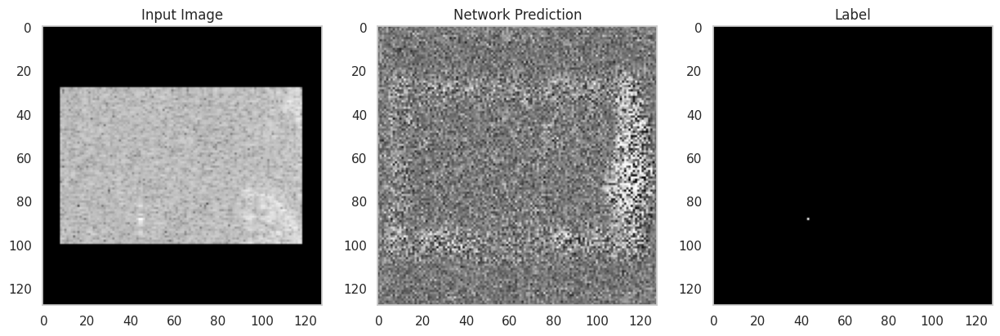

 10%|█         | 41/400 [00:04<00:39,  9.11it/s]

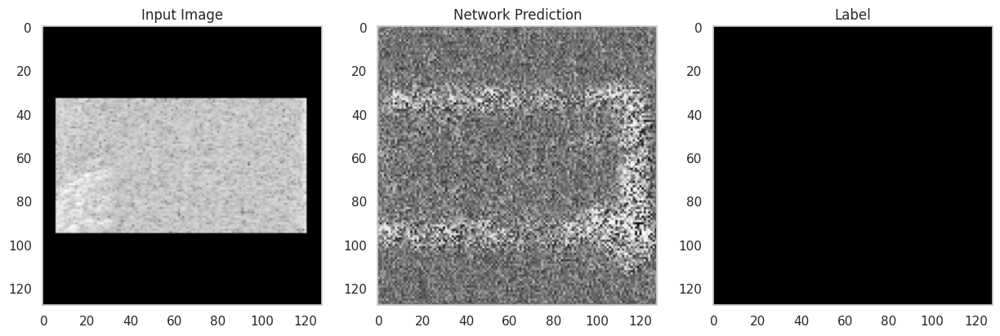

 12%|█▏        | 47/400 [00:05<00:42,  8.22it/s]

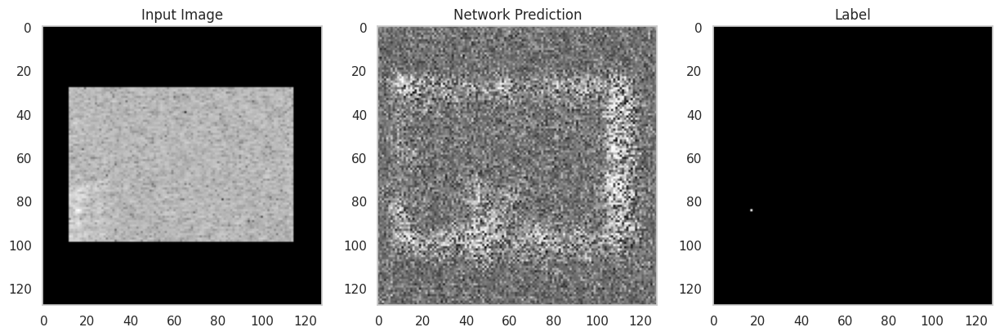

 52%|█████▏    | 207/400 [00:20<00:18, 10.45it/s]

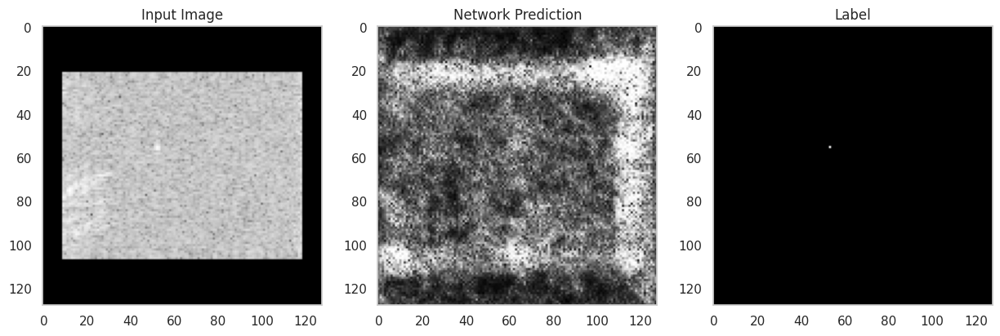

 53%|█████▎    | 211/400 [00:21<00:23,  7.94it/s]

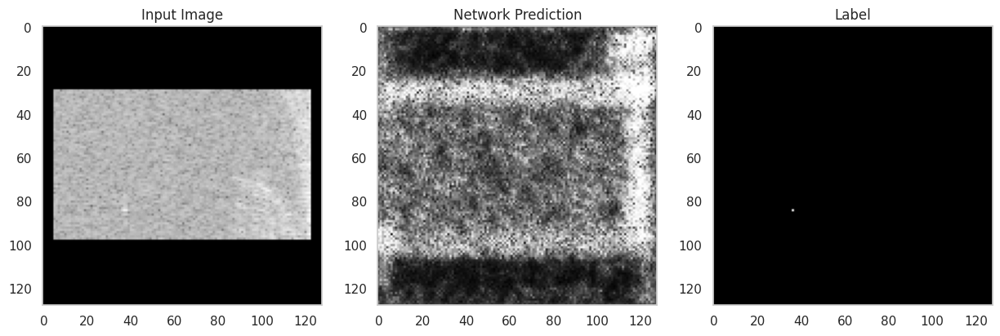

 56%|█████▌    | 223/400 [00:22<00:18,  9.41it/s]

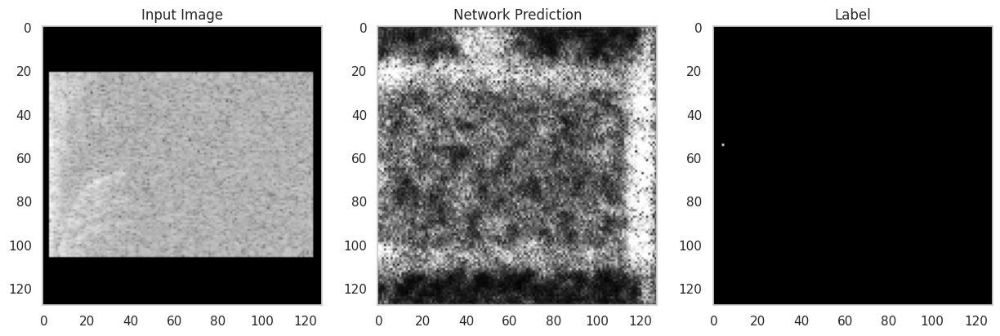

 59%|█████▉    | 237/400 [00:24<00:16,  9.83it/s]

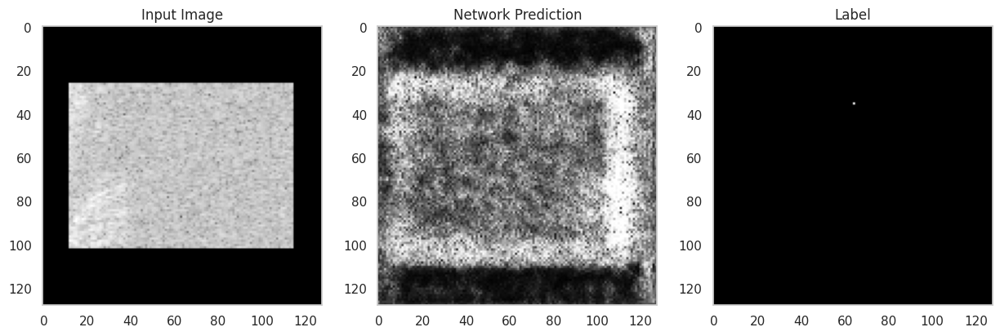

 68%|██████▊   | 271/400 [00:28<00:12, 10.37it/s]

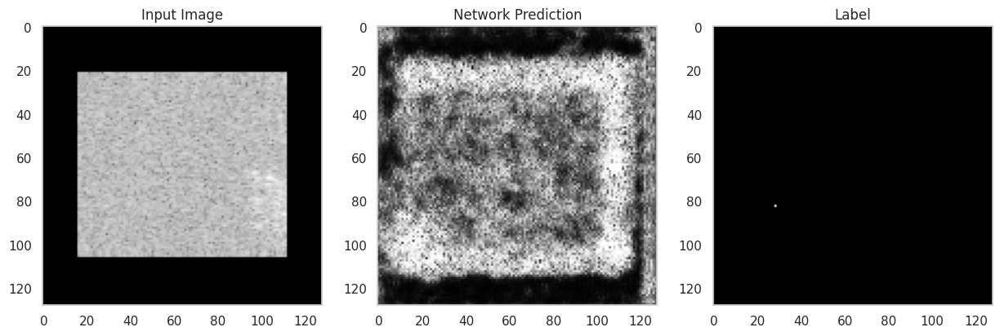

 69%|██████▉   | 277/400 [00:28<00:14,  8.34it/s]

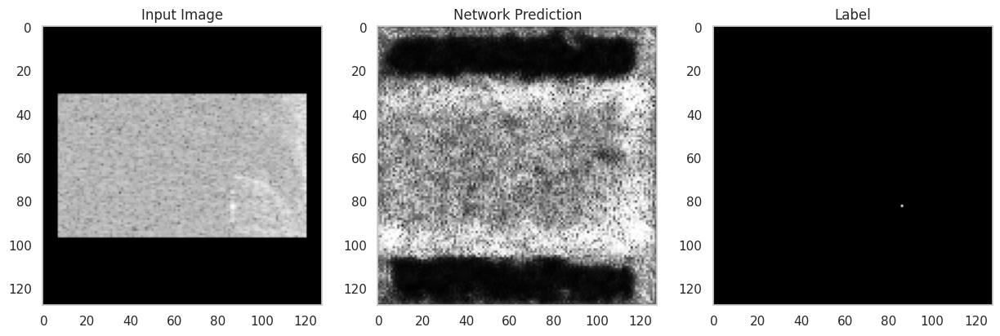

 95%|█████████▍| 379/400 [00:39<00:02, 10.30it/s]

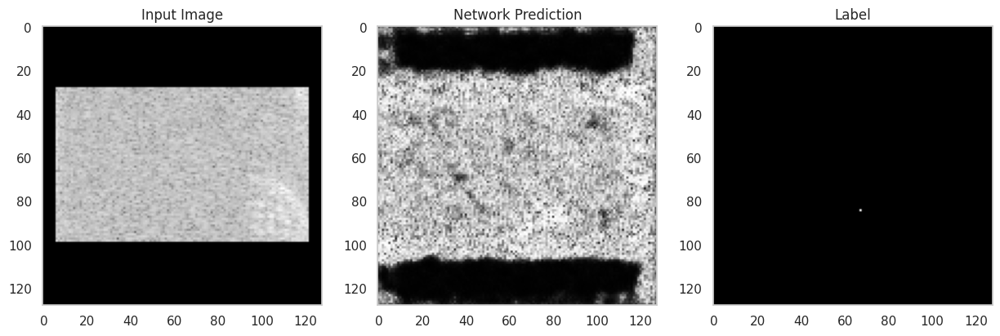

 96%|█████████▌| 384/400 [00:39<00:01,  8.09it/s]

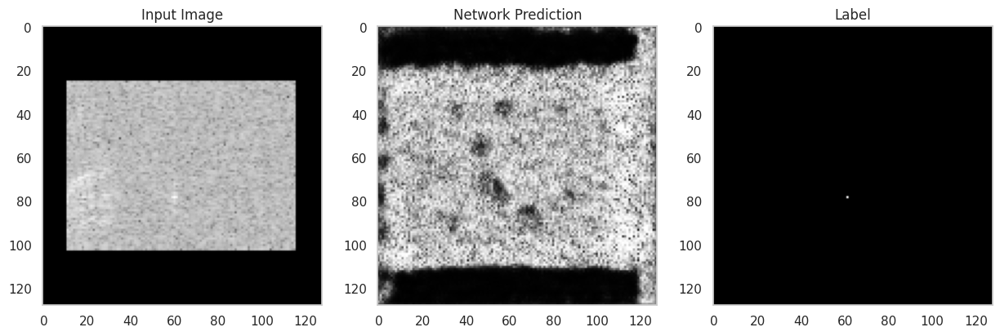

100%|██████████| 400/400 [00:41<00:00,  9.53it/s]


Epoch 1/50, Loss: 0.99988184


  1%|          | 3/400 [00:00<00:39, 10.04it/s]

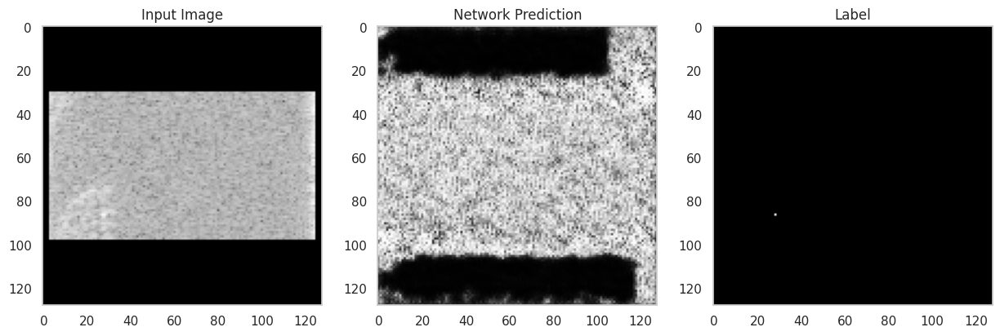

  8%|▊         | 31/400 [00:03<00:36, 10.12it/s]

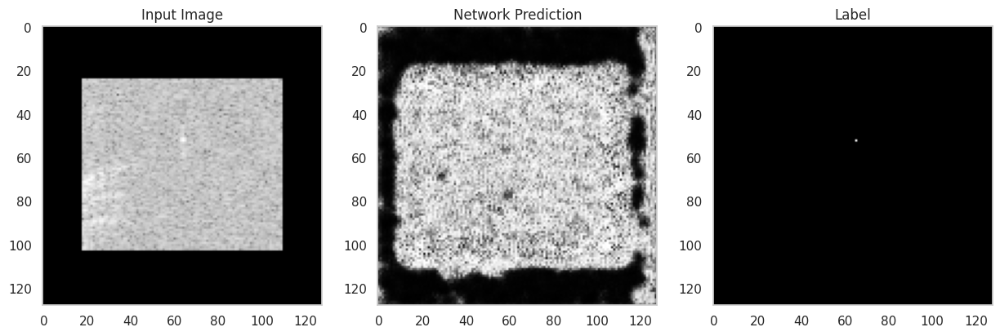

 10%|▉         | 39/400 [00:04<00:40,  8.89it/s]

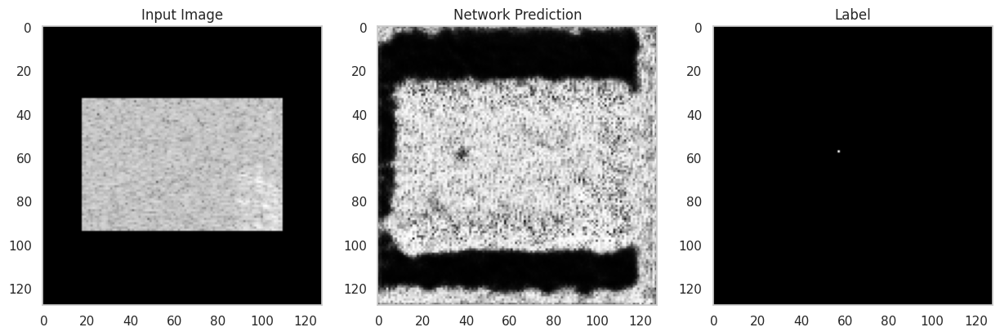

 18%|█▊        | 72/400 [00:07<00:31, 10.37it/s]

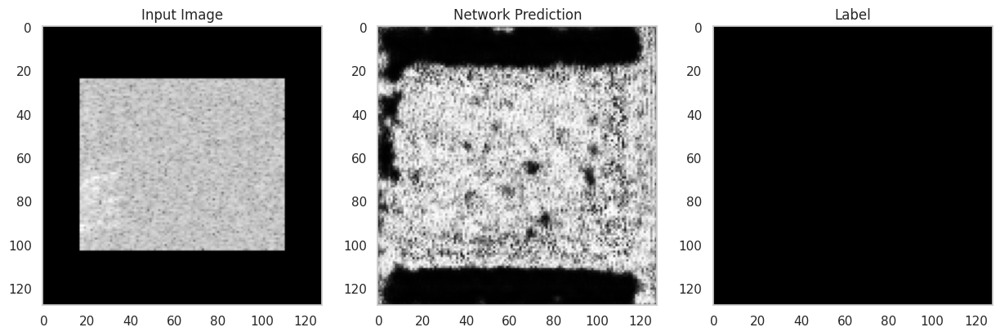

 79%|███████▉  | 317/400 [00:32<00:08, 10.08it/s]

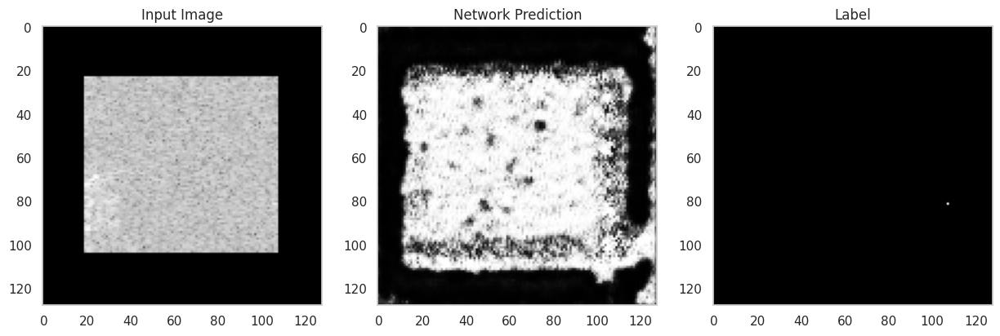

 87%|████████▋ | 347/400 [00:35<00:05, 10.21it/s]

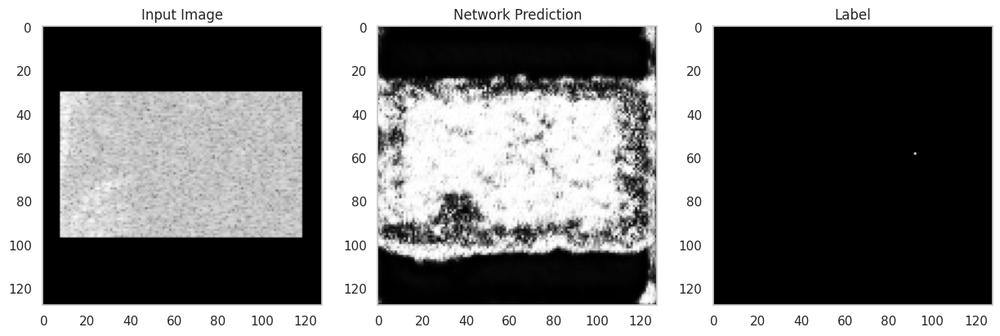

100%|█████████▉| 399/400 [00:40<00:00,  9.85it/s]

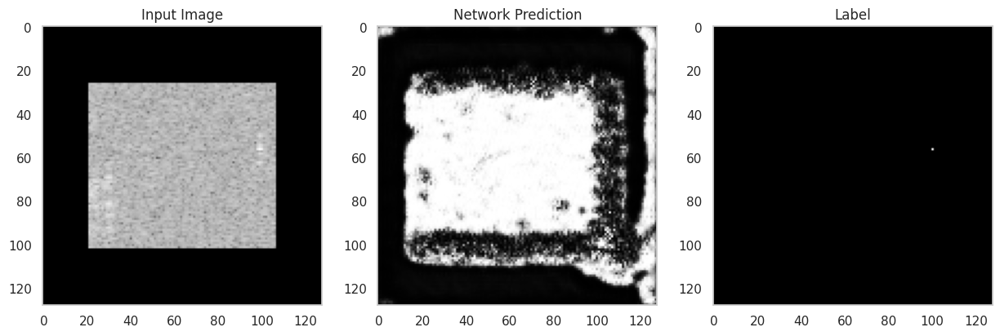

100%|██████████| 400/400 [00:41<00:00,  9.71it/s]


Epoch 2/50, Loss: 0.99987561


 47%|████▋     | 188/400 [00:18<00:20, 10.23it/s]

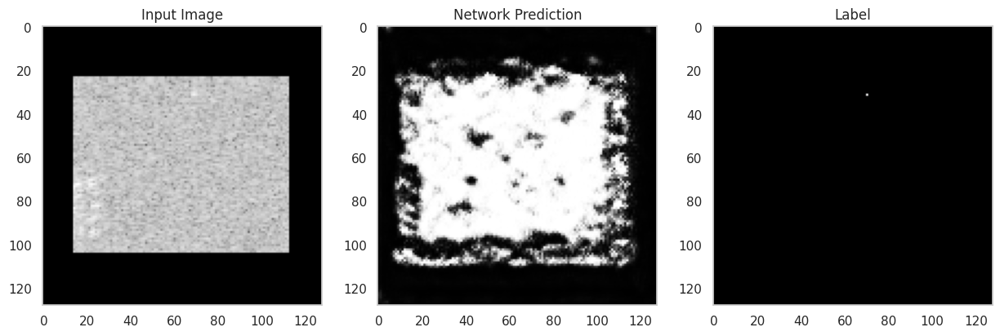

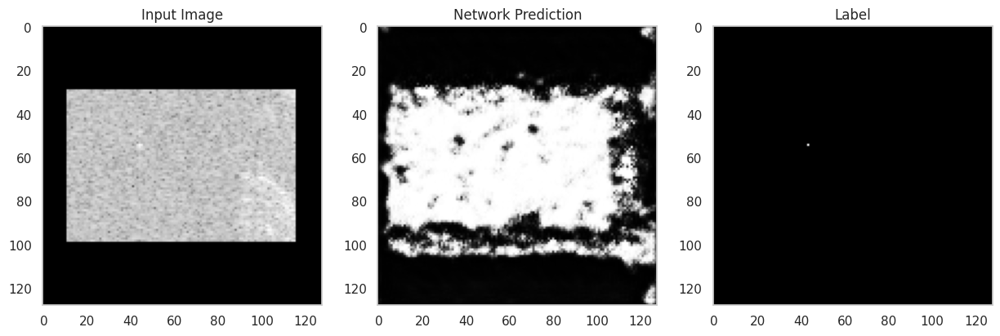

 52%|█████▏    | 209/400 [00:21<00:19,  9.64it/s]

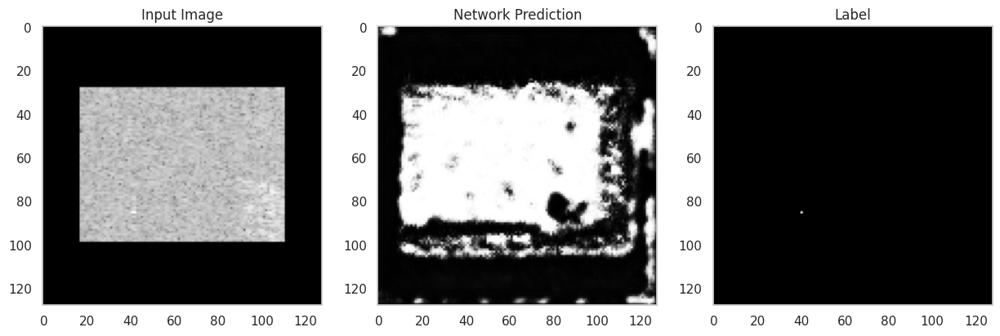

 69%|██████▉   | 277/400 [00:28<00:12, 10.15it/s]

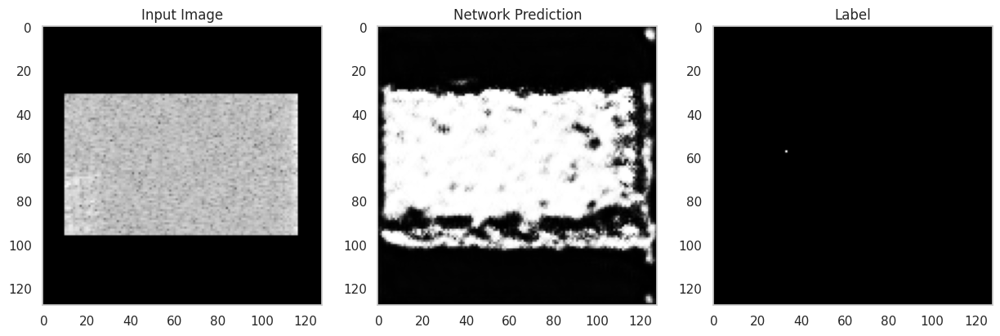

 77%|███████▋  | 309/400 [00:32<00:08, 10.15it/s]

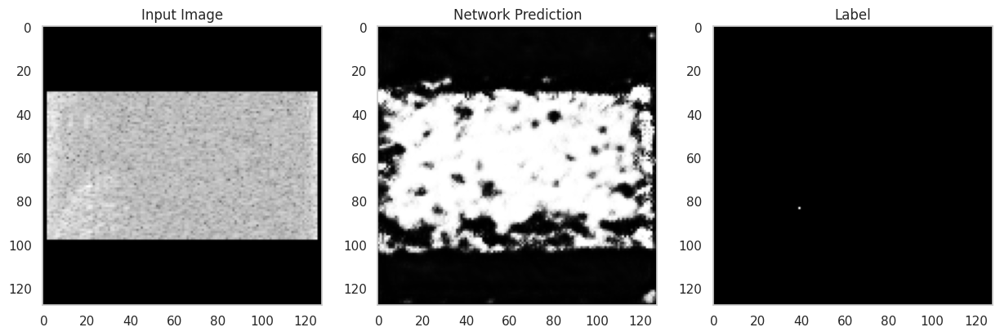

 95%|█████████▌| 381/400 [00:39<00:01, 10.03it/s]

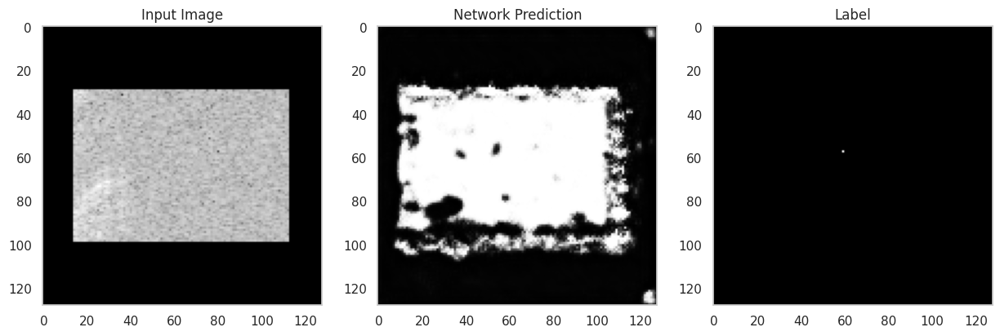

 98%|█████████▊| 391/400 [00:40<00:00,  9.11it/s]

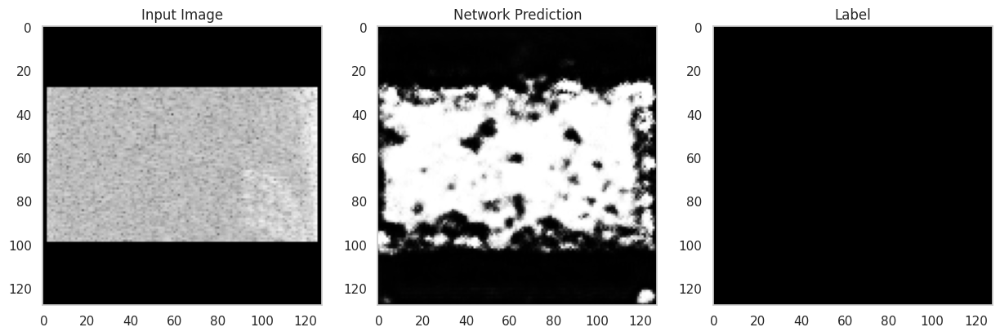

100%|██████████| 400/400 [00:42<00:00,  9.52it/s]


Epoch 3/50, Loss: 0.99987071


 15%|█▌        | 60/400 [00:05<00:32, 10.31it/s]

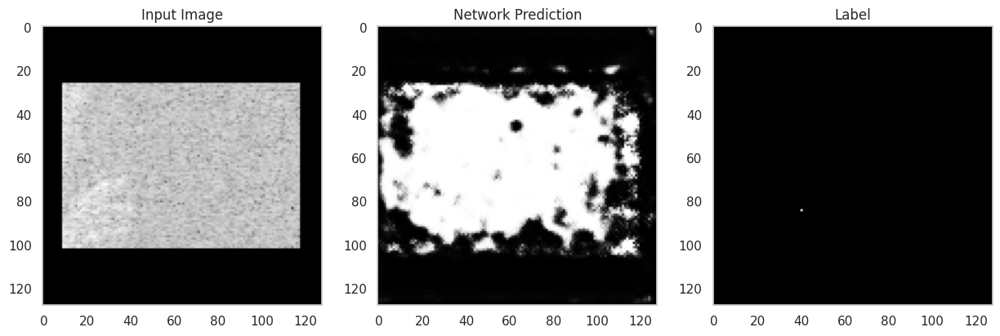

 32%|███▏      | 126/400 [00:12<00:27, 10.03it/s]

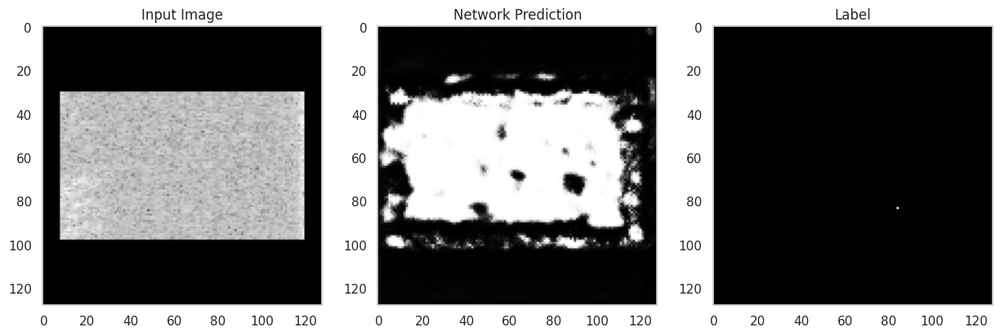

 68%|██████▊   | 274/400 [00:27<00:12, 10.11it/s]

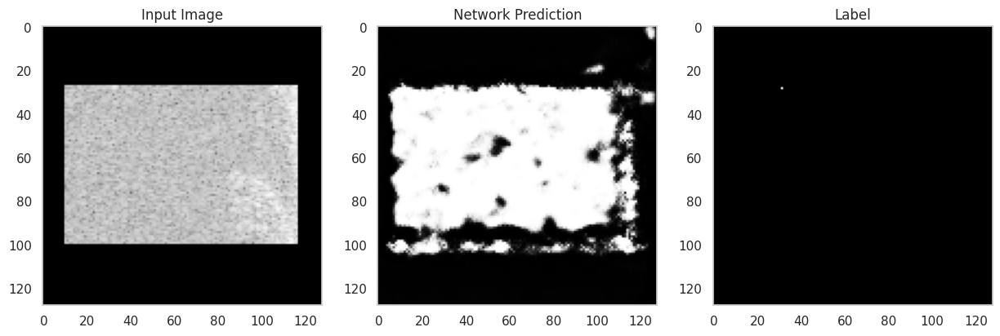

 78%|███████▊  | 312/400 [00:31<00:10,  8.69it/s]

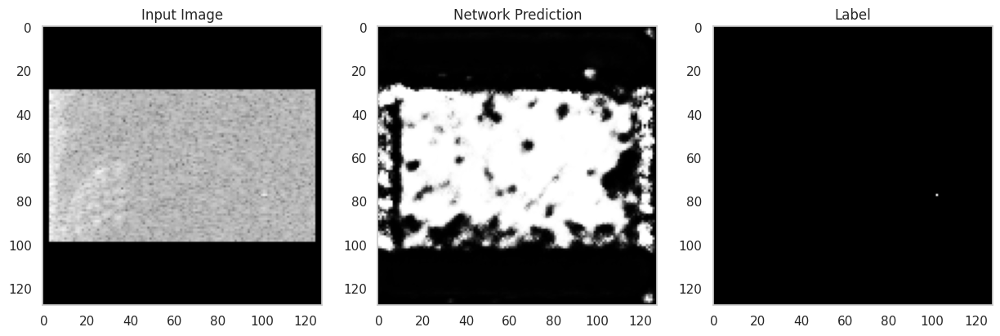

 90%|█████████ | 360/400 [00:37<00:04,  9.04it/s]

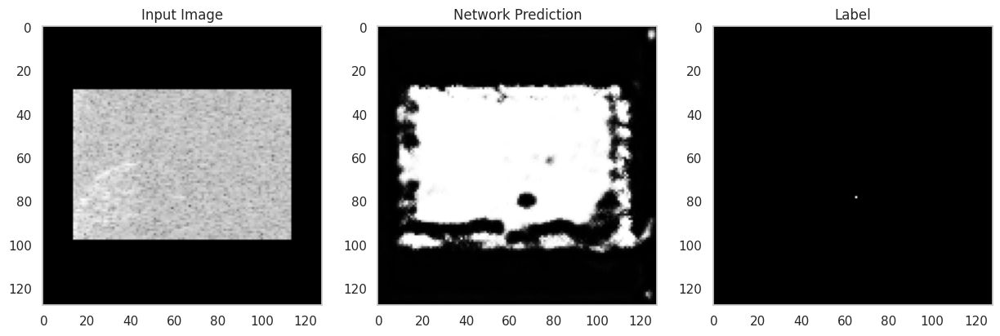

100%|█████████▉| 398/400 [00:41<00:00, 10.27it/s]

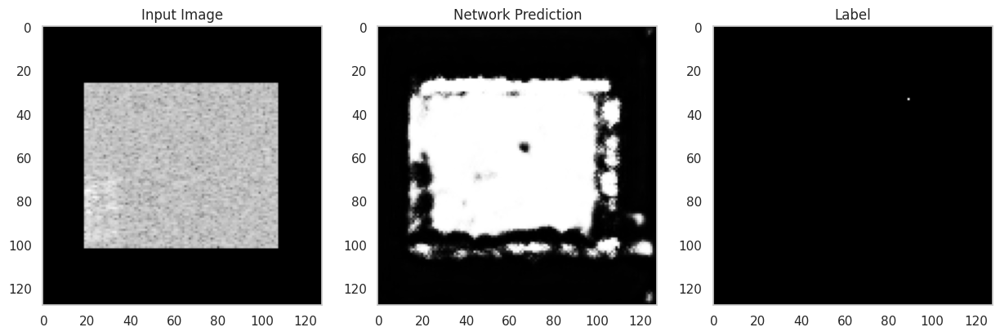

100%|██████████| 400/400 [00:41<00:00,  9.53it/s]


Epoch 4/50, Loss: 0.99986750


 17%|█▋        | 68/400 [00:06<00:32, 10.07it/s]

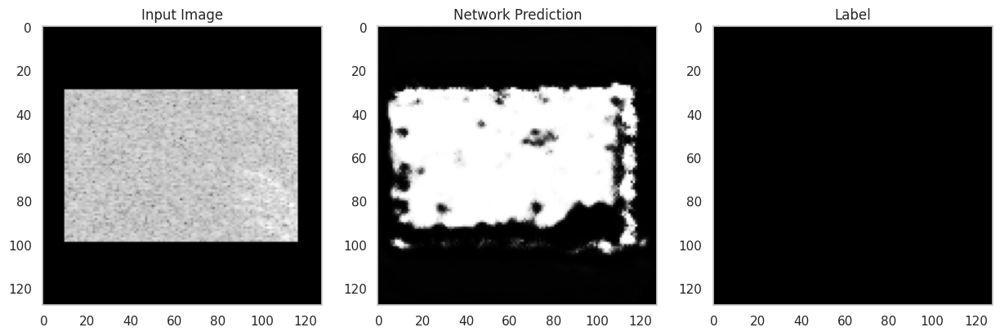

 22%|██▏       | 88/400 [00:09<00:45,  6.81it/s]

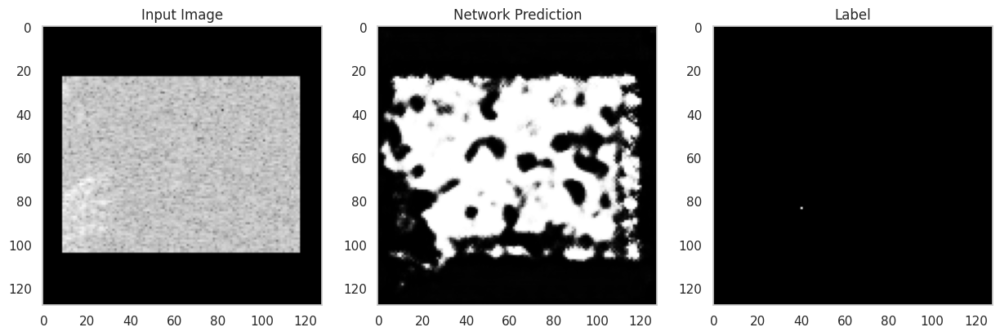

 33%|███▎      | 133/400 [00:15<00:28,  9.33it/s]

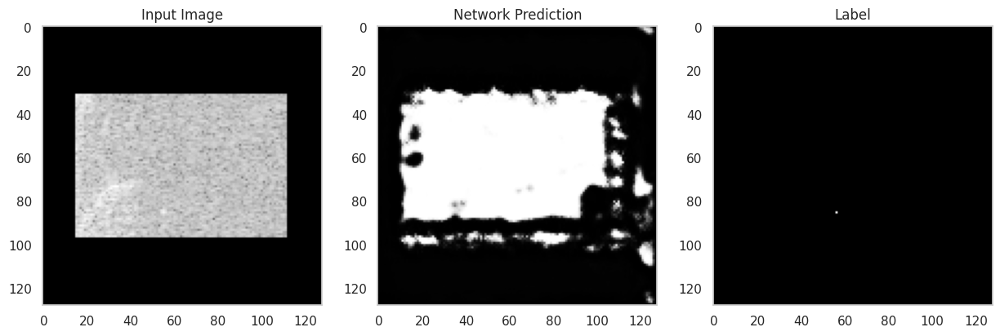

 34%|███▍      | 138/400 [00:16<00:34,  7.67it/s]

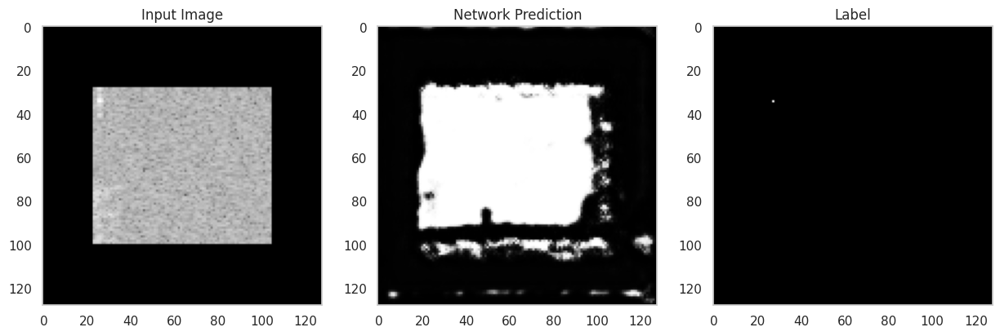

 50%|████▉     | 198/400 [00:22<00:20,  9.65it/s]

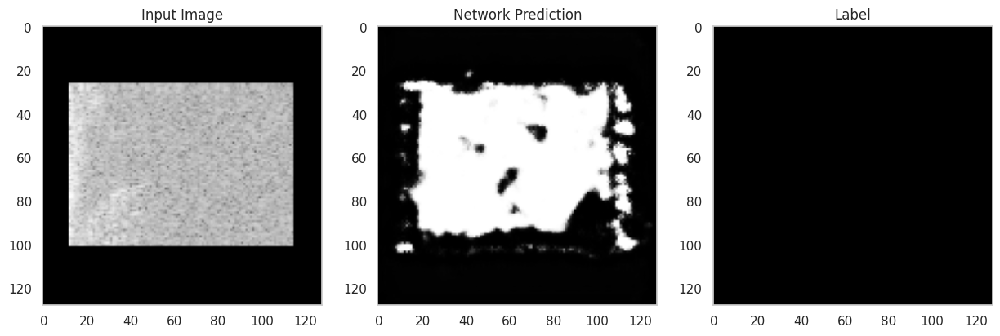

 52%|█████▎    | 210/400 [00:24<00:19,  9.70it/s]

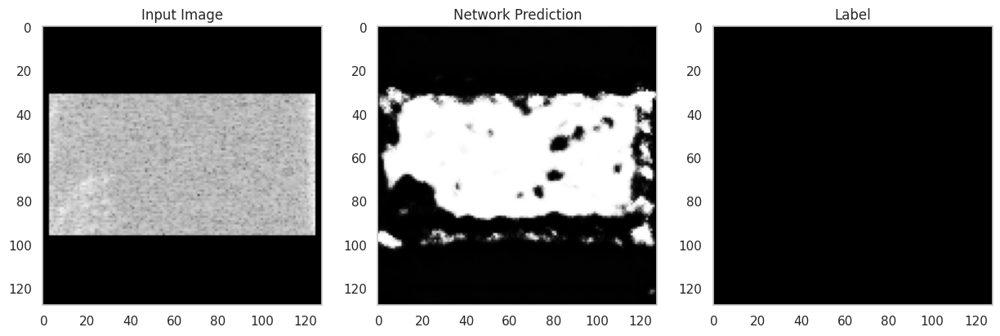

 64%|██████▍   | 258/400 [00:29<00:15,  9.30it/s]

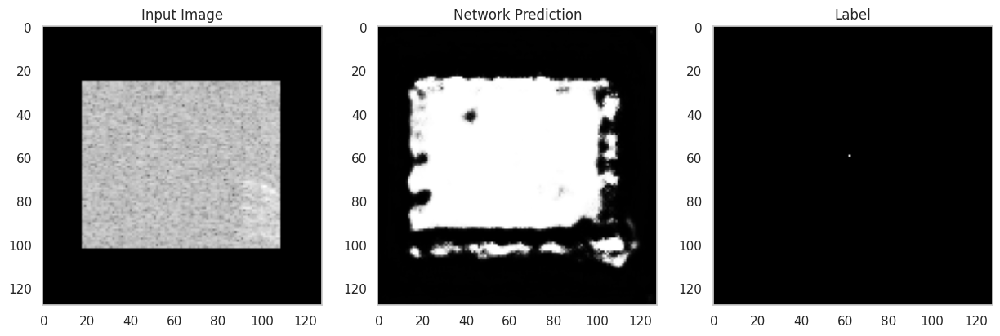

 88%|████████▊ | 351/400 [00:40<00:05,  9.16it/s]

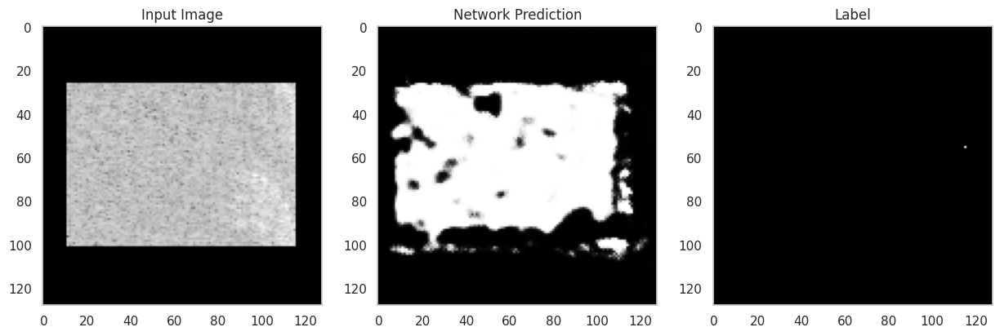

100%|██████████| 400/400 [00:46<00:00,  8.60it/s]


Epoch 5/50, Loss: 0.99986751


  4%|▍         | 18/400 [00:01<00:39,  9.75it/s]

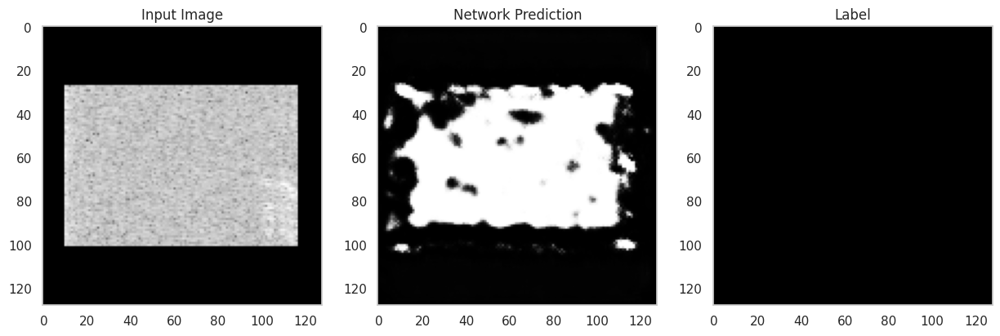

 18%|█▊        | 70/400 [00:07<00:37,  8.91it/s]

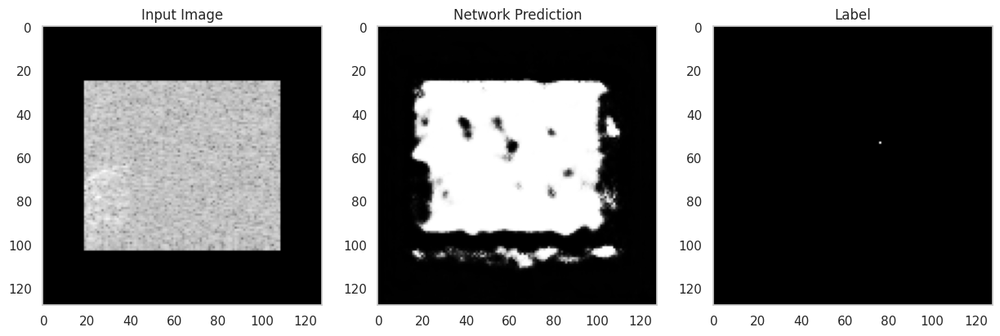

 32%|███▎      | 130/400 [00:14<00:27,  9.89it/s]

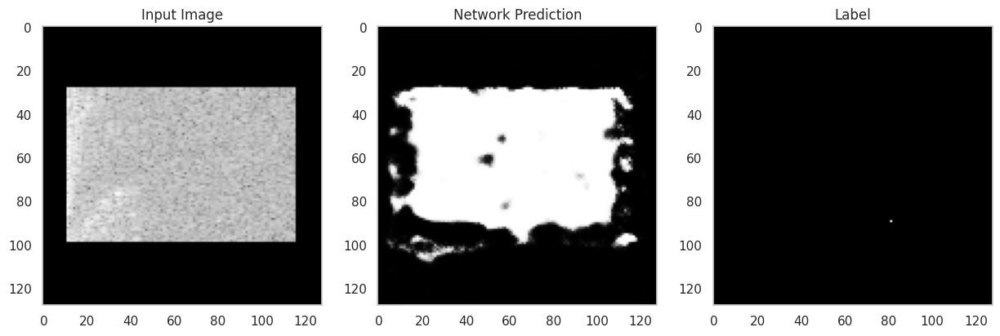

 33%|███▎      | 133/400 [00:15<00:38,  6.98it/s]

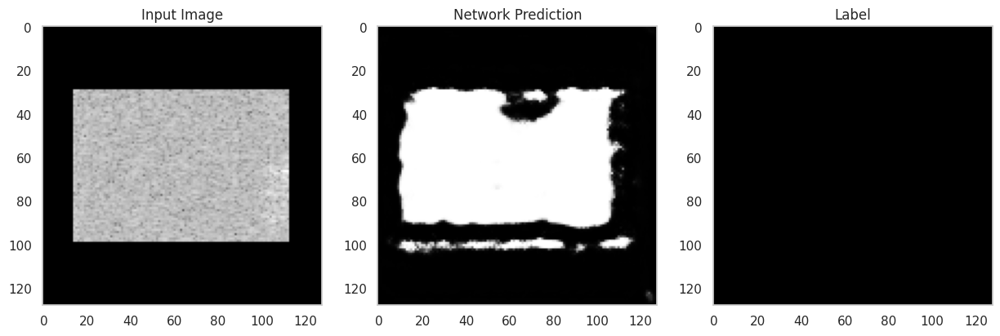

 46%|████▋     | 186/400 [00:21<00:22,  9.61it/s]

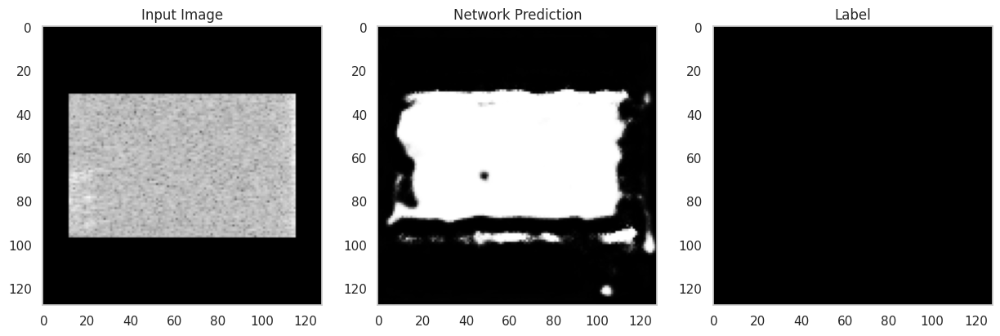

 60%|█████▉    | 238/400 [00:27<00:18,  8.55it/s]

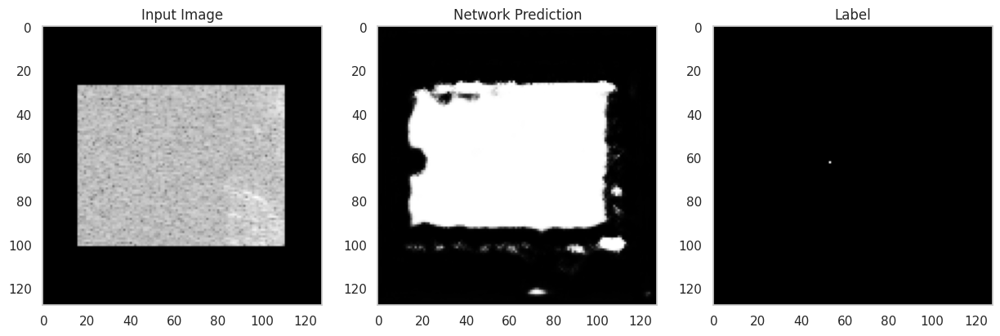

 63%|██████▎   | 251/400 [00:29<00:16,  8.89it/s]

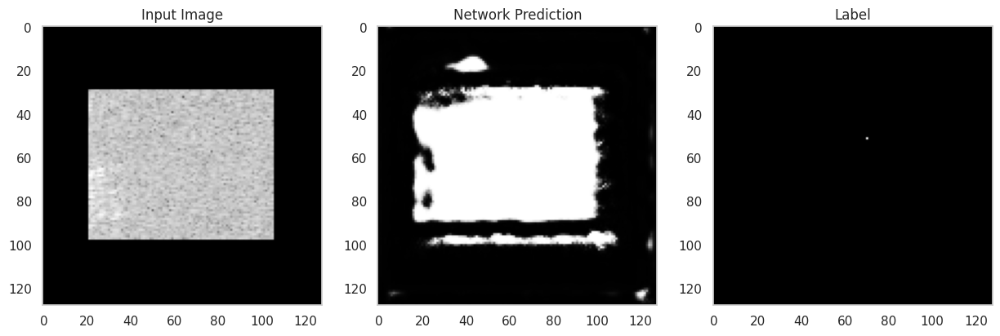

 69%|██████▉   | 275/400 [00:32<00:13,  9.58it/s]

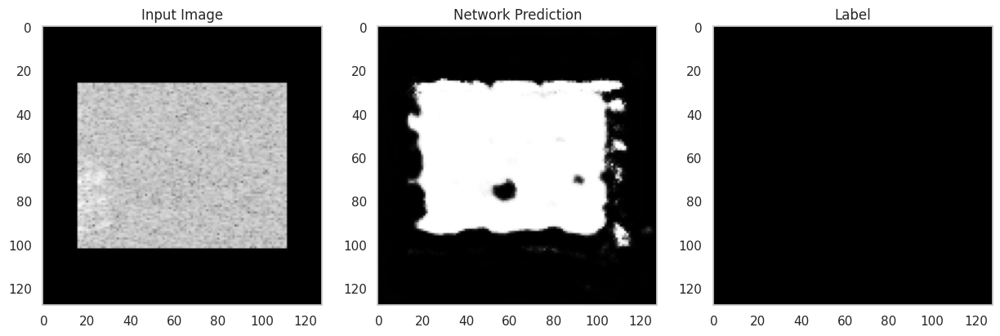

 69%|██████▉   | 276/400 [00:32<00:24,  5.01it/s]

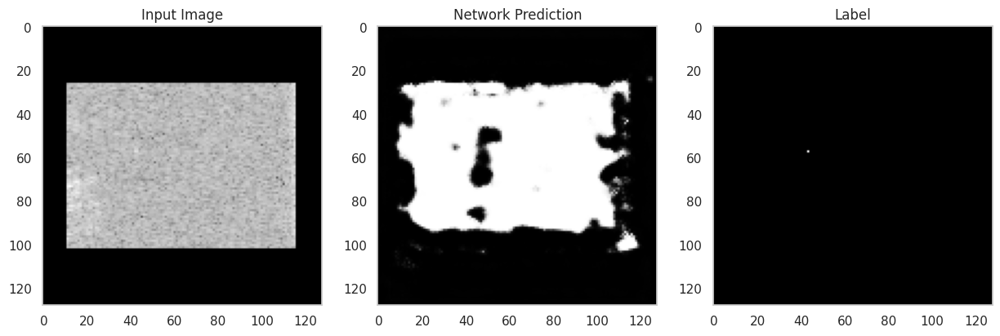

 72%|███████▏  | 287/400 [00:34<00:12,  8.86it/s]

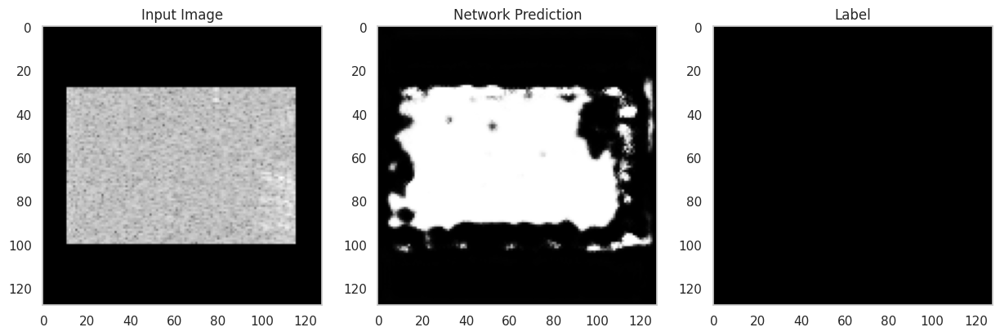

 77%|███████▋  | 307/400 [00:36<00:09,  9.85it/s]

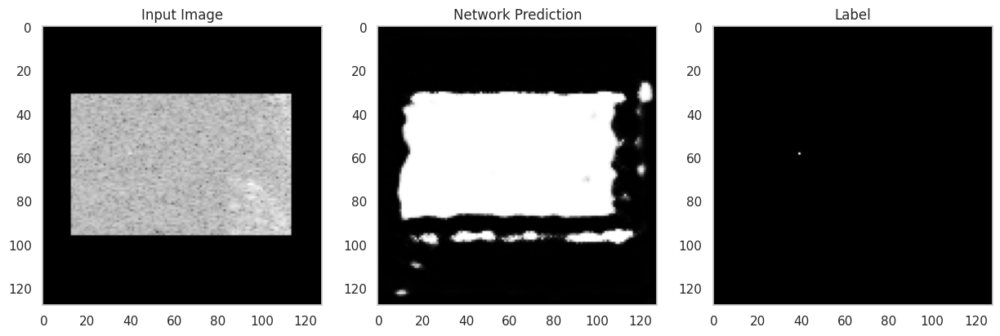

 77%|███████▋  | 308/400 [00:37<00:19,  4.76it/s]

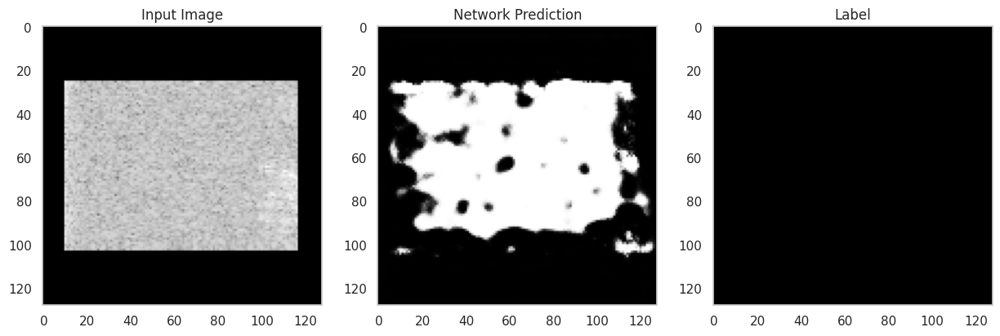

 91%|█████████ | 364/400 [00:43<00:03,  9.05it/s]

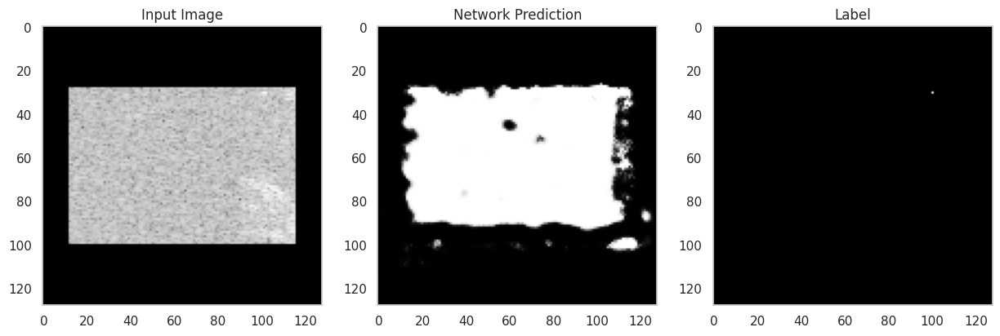

 96%|█████████▋| 385/400 [00:46<00:01,  9.85it/s]

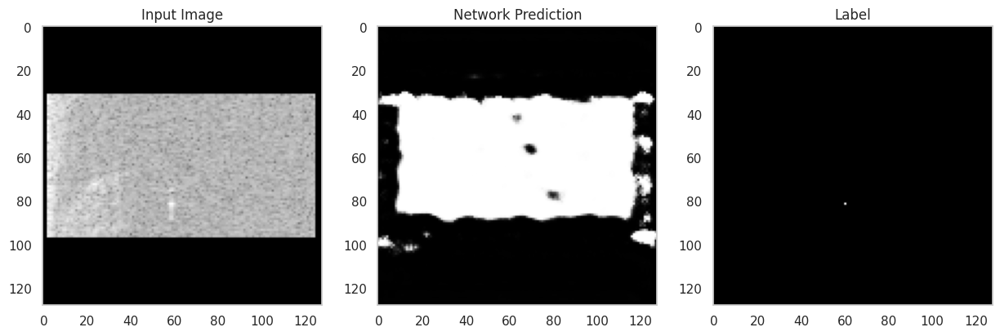

100%|██████████| 400/400 [00:48<00:00,  8.25it/s]


Epoch 6/50, Loss: 0.99986680


  1%|          | 4/400 [00:00<00:52,  7.58it/s]

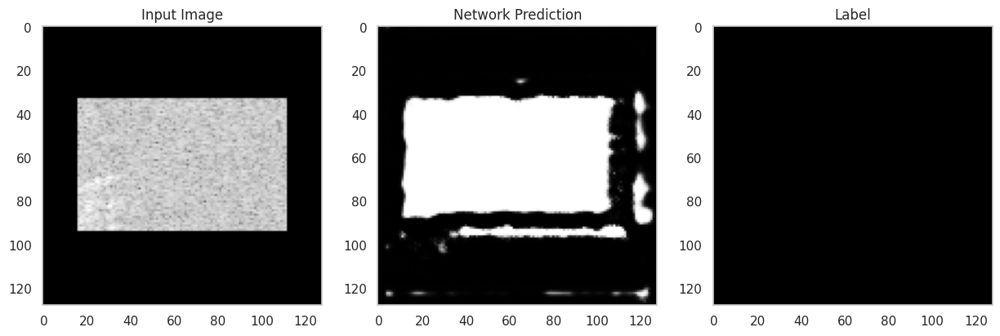

 22%|██▏       | 87/400 [00:09<00:30, 10.35it/s]

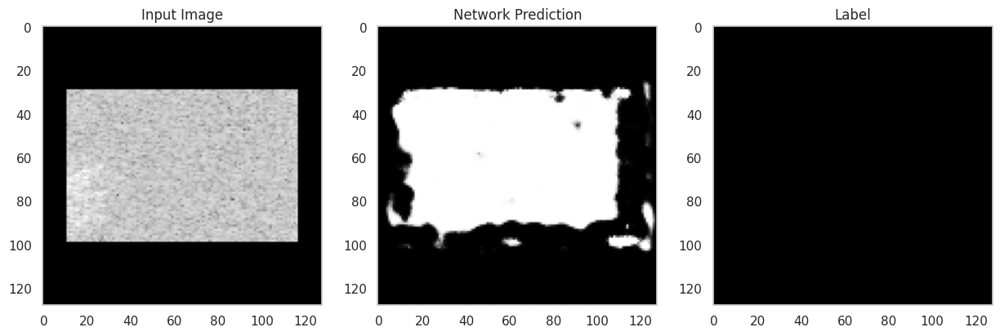

 33%|███▎      | 131/400 [00:14<00:25, 10.41it/s]

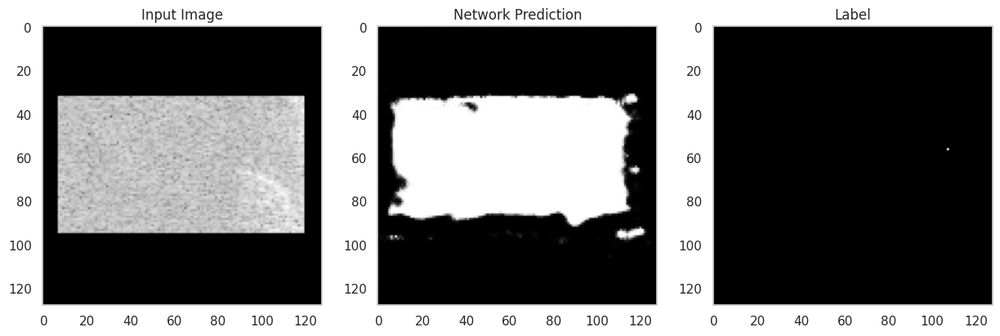

 54%|█████▍    | 216/400 [00:22<00:19,  9.37it/s]

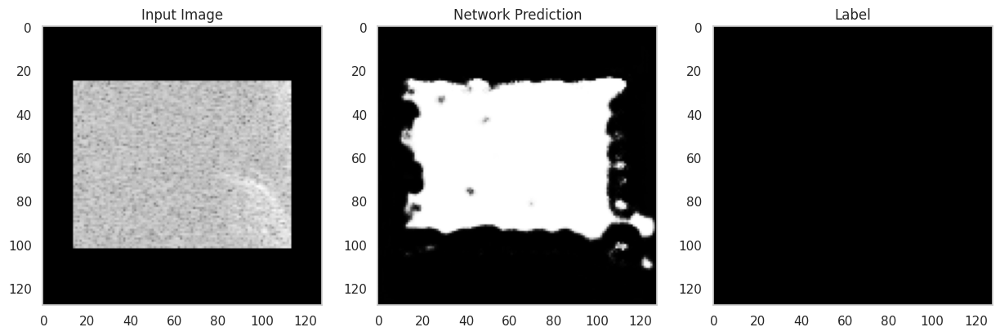

 64%|██████▍   | 256/400 [00:27<00:16,  8.85it/s]

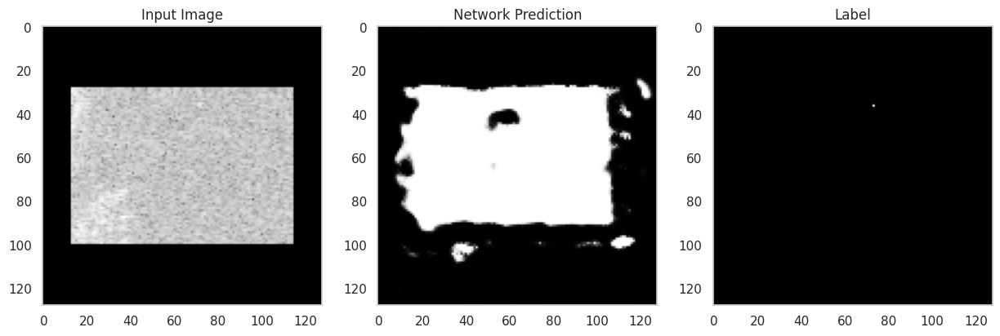

 68%|██████▊   | 273/400 [00:29<00:13,  9.44it/s]

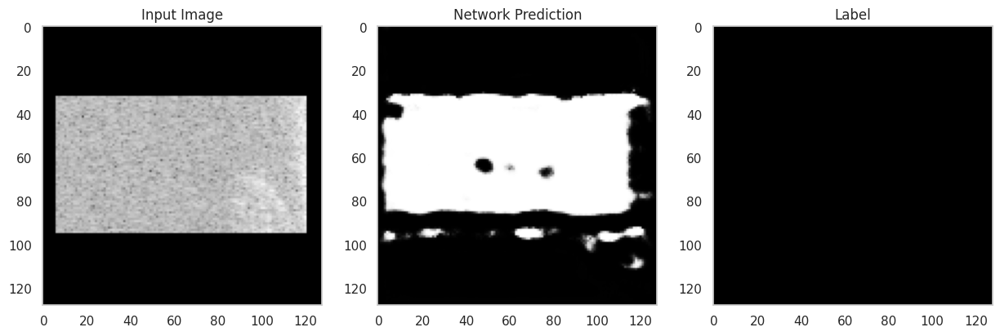

 90%|████████▉ | 359/400 [00:40<00:05,  7.60it/s]

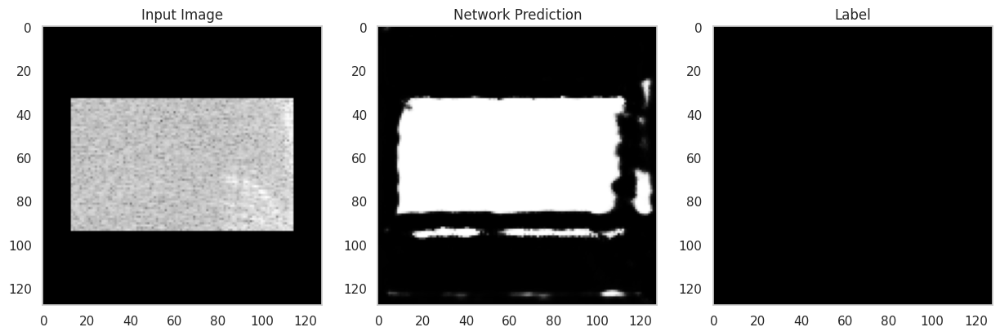

100%|██████████| 400/400 [00:45<00:00,  8.84it/s]


Epoch 7/50, Loss: 0.99986611


 11%|█         | 43/400 [00:04<00:40,  8.79it/s]

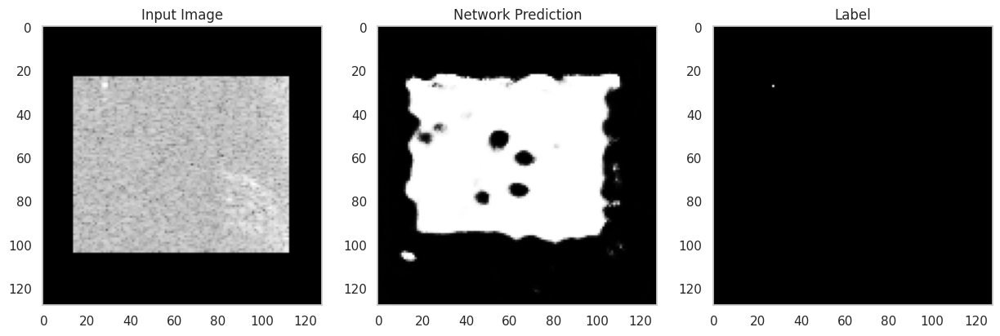

 16%|█▌        | 64/400 [00:07<00:33, 10.00it/s]

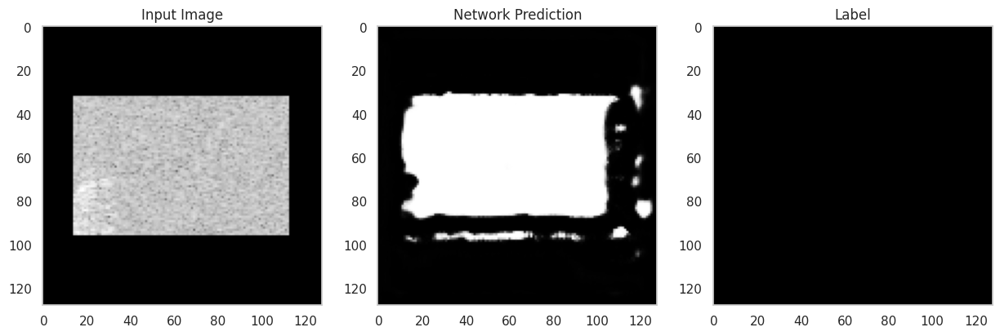

 26%|██▋       | 106/400 [00:12<00:30,  9.51it/s]

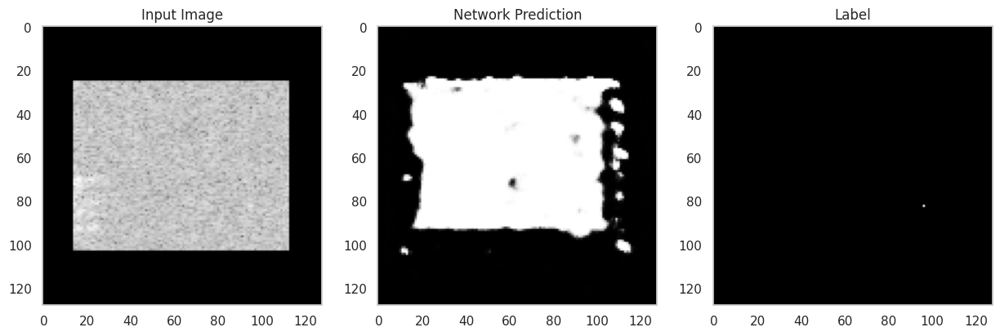

 29%|██▉       | 115/400 [00:13<00:35,  8.09it/s]

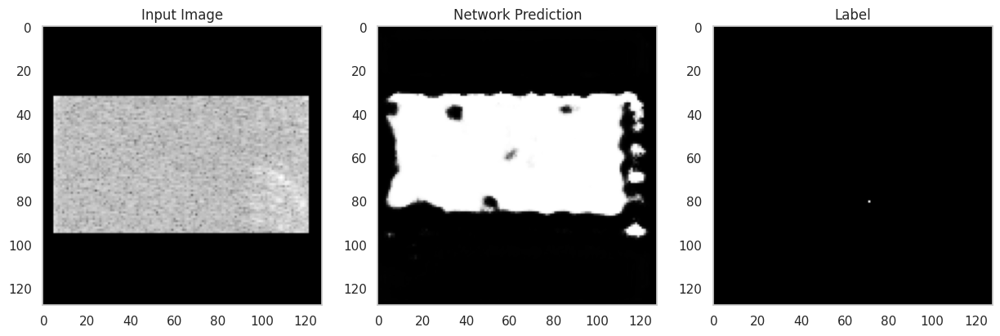

 52%|█████▎    | 210/400 [00:25<00:20,  9.24it/s]

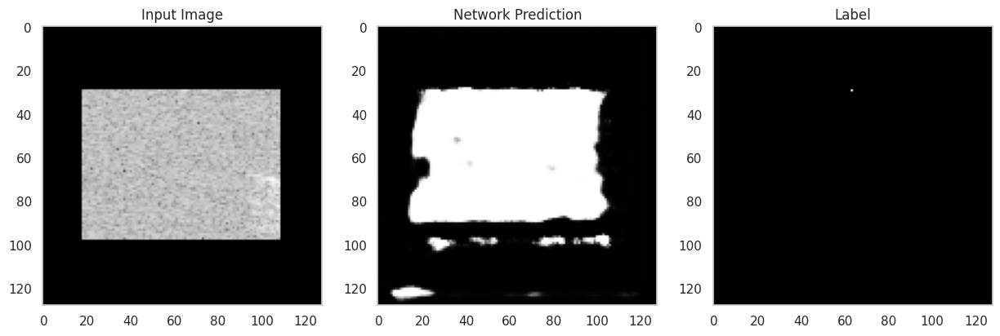

 76%|███████▌  | 303/400 [00:35<00:10,  8.86it/s]

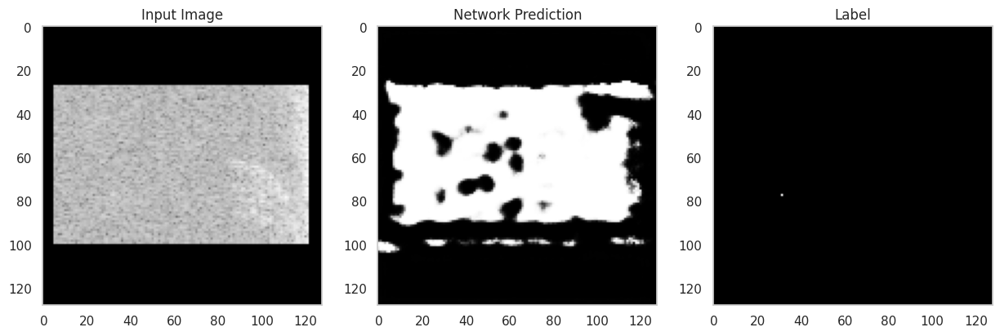

 97%|█████████▋| 387/400 [00:45<00:01,  9.91it/s]

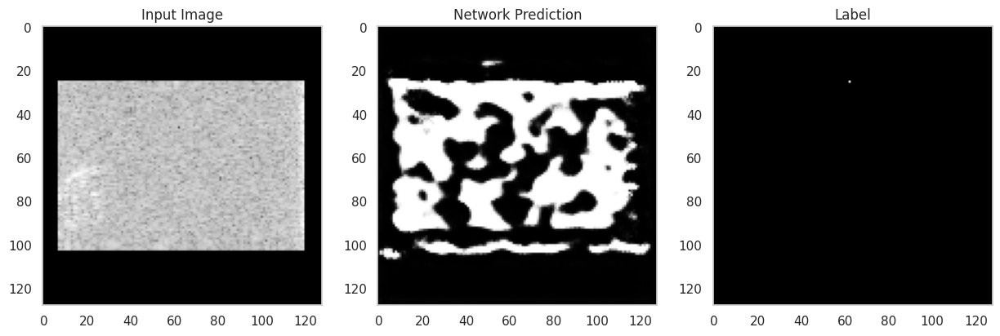

100%|██████████| 400/400 [00:47<00:00,  8.46it/s]


Epoch 8/50, Loss: 0.99986850


  8%|▊         | 33/400 [00:03<00:35, 10.31it/s]

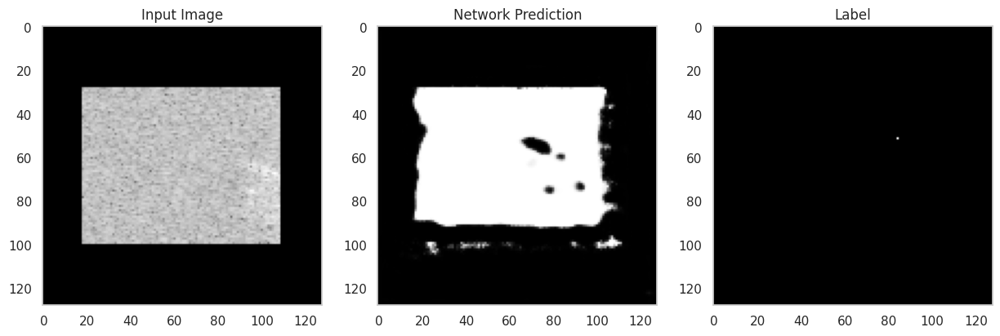

 14%|█▍        | 56/400 [00:05<00:33, 10.26it/s]

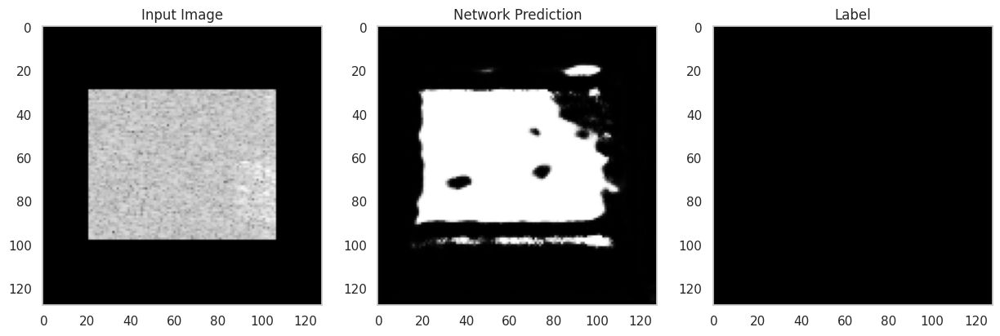

 21%|██▏       | 85/400 [00:08<00:30, 10.27it/s]

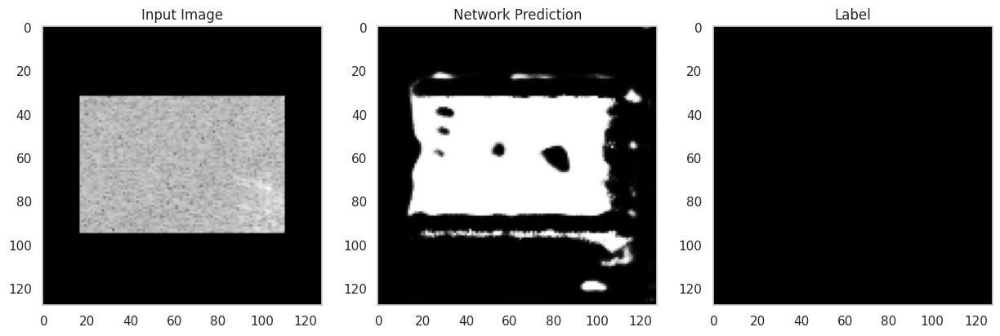

 40%|████      | 162/400 [00:17<00:26,  9.01it/s]

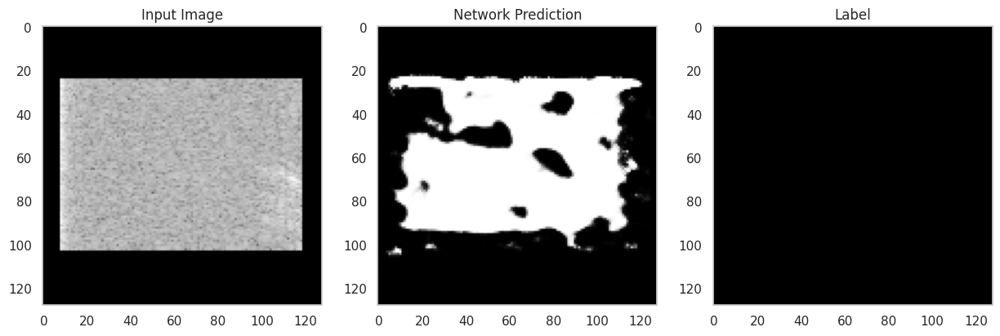

 48%|████▊     | 194/400 [00:21<00:25,  8.23it/s]

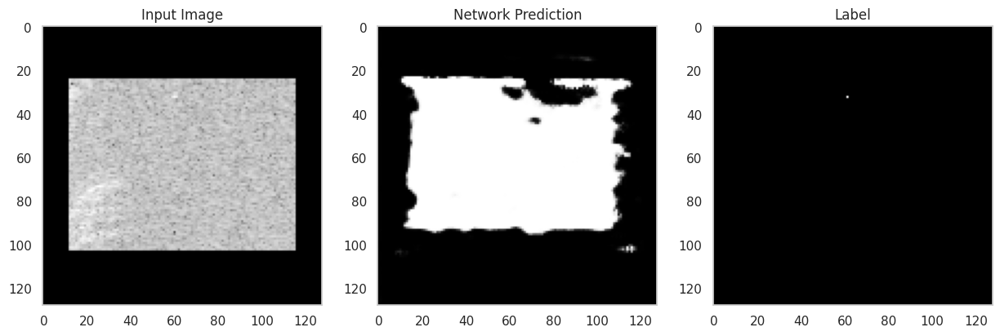

 53%|█████▎    | 213/400 [00:24<00:22,  8.44it/s]

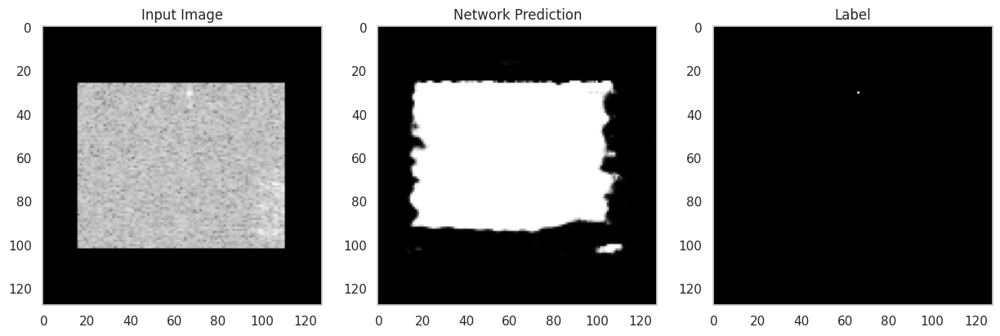

 74%|███████▍  | 298/400 [00:34<00:13,  7.55it/s]

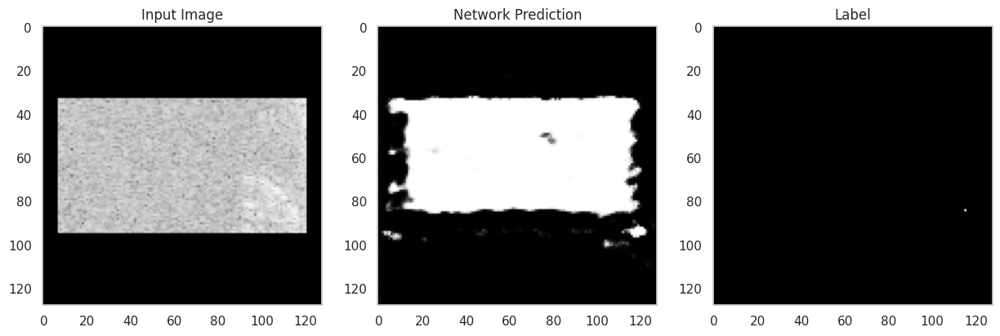

 83%|████████▎ | 332/400 [00:39<00:07,  8.76it/s]

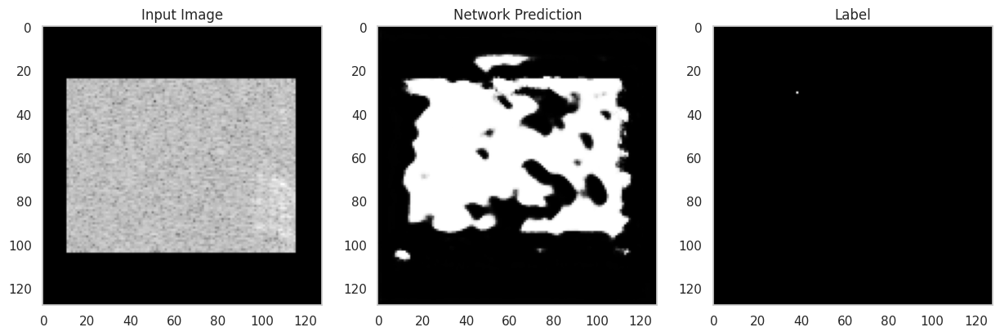

 94%|█████████▍| 376/400 [00:44<00:03,  7.95it/s]

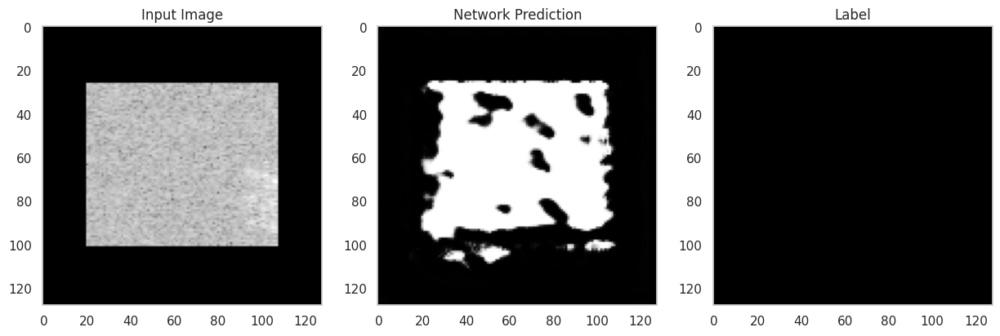

 96%|█████████▌| 383/400 [00:46<00:02,  8.06it/s]

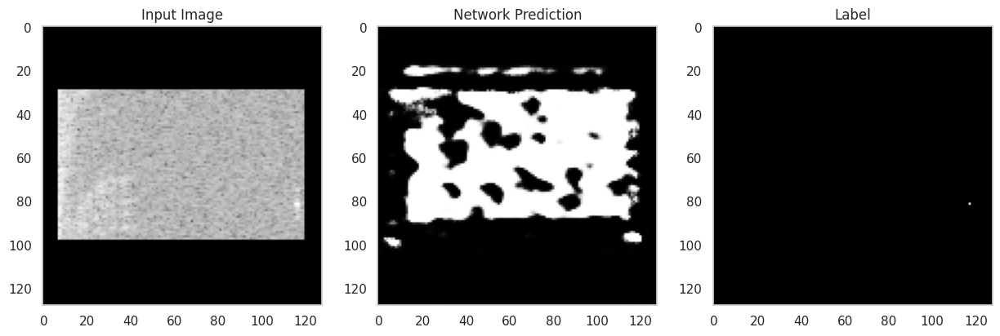

100%|██████████| 400/400 [00:48<00:00,  8.24it/s]


Epoch 9/50, Loss: 0.99986577


 22%|██▎       | 90/400 [00:10<00:38,  8.10it/s]

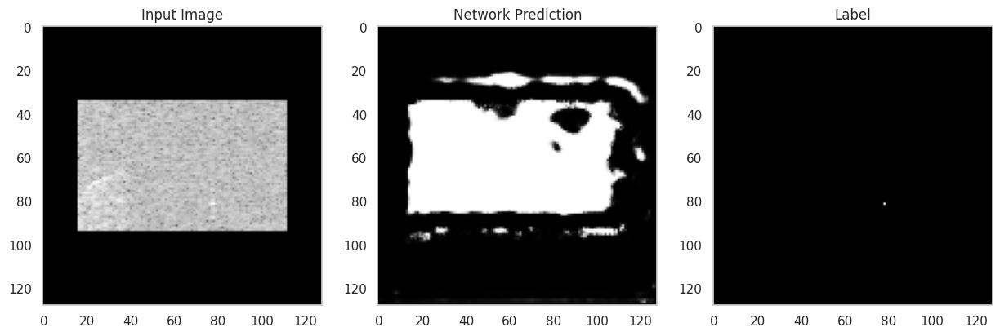

 35%|███▍      | 139/400 [00:16<00:25, 10.25it/s]

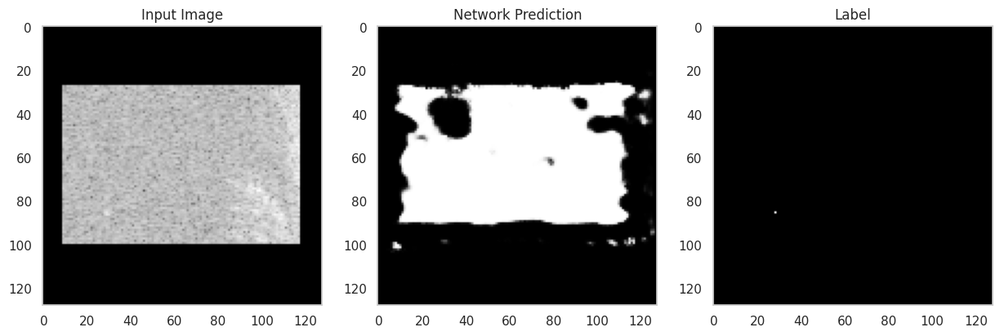

 47%|████▋     | 188/400 [00:21<00:22,  9.23it/s]

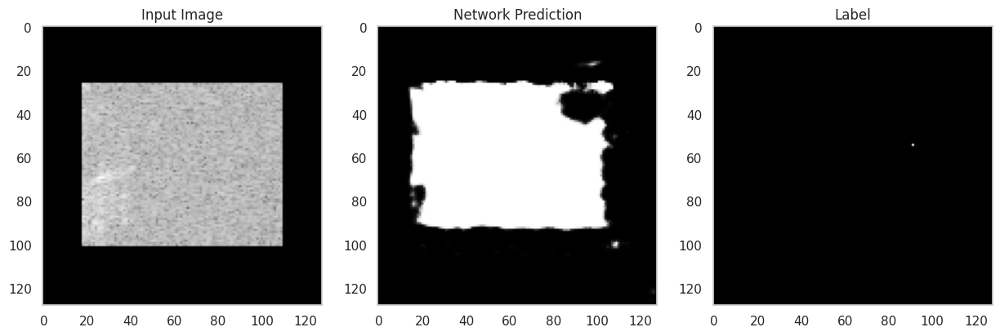

 54%|█████▎    | 214/400 [00:24<00:23,  7.77it/s]

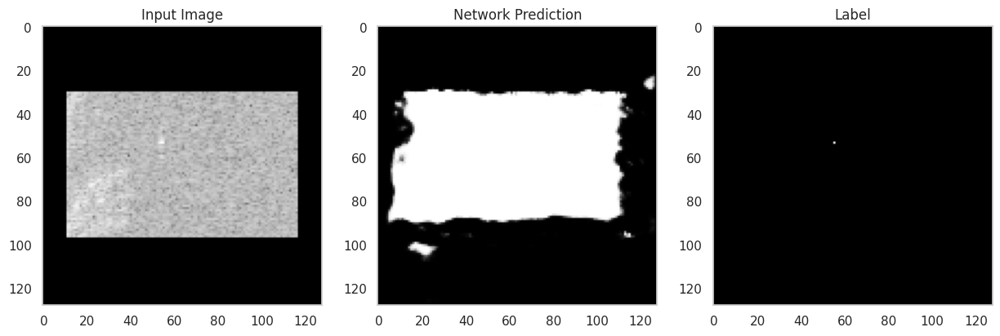

 61%|██████    | 243/400 [00:28<00:18,  8.63it/s]

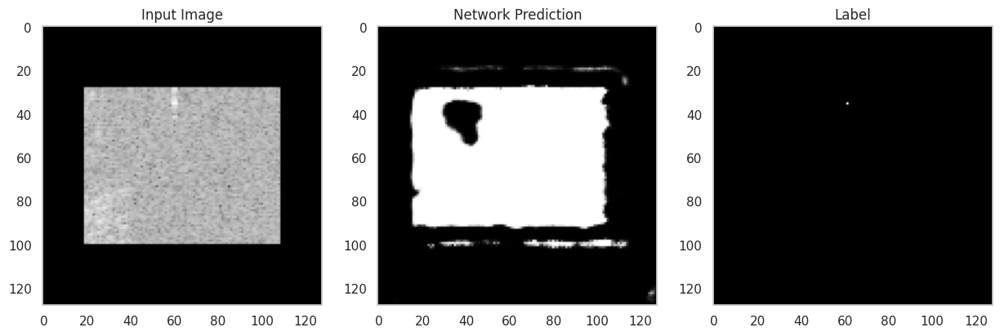

 62%|██████▏   | 246/400 [00:29<00:30,  5.01it/s]

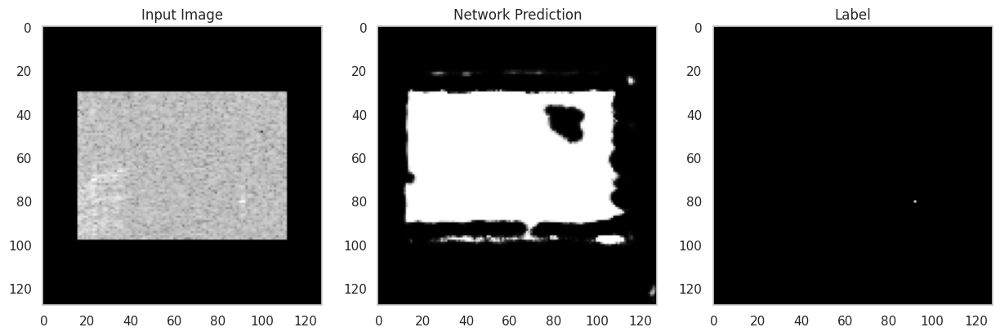

 70%|██████▉   | 279/400 [00:34<00:14,  8.45it/s]

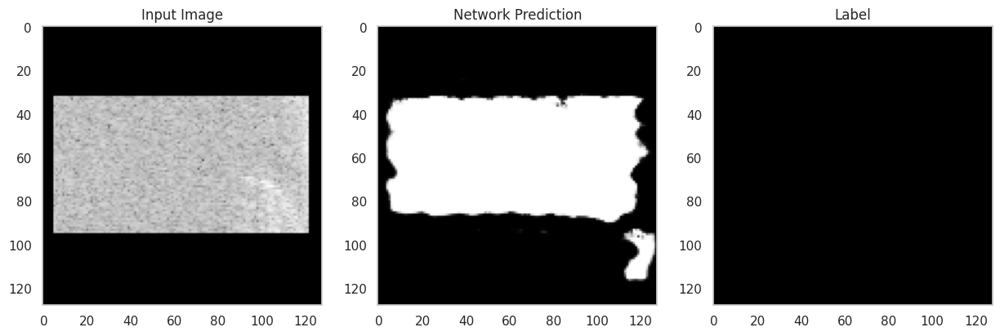

 74%|███████▍  | 295/400 [00:36<00:11,  9.45it/s]

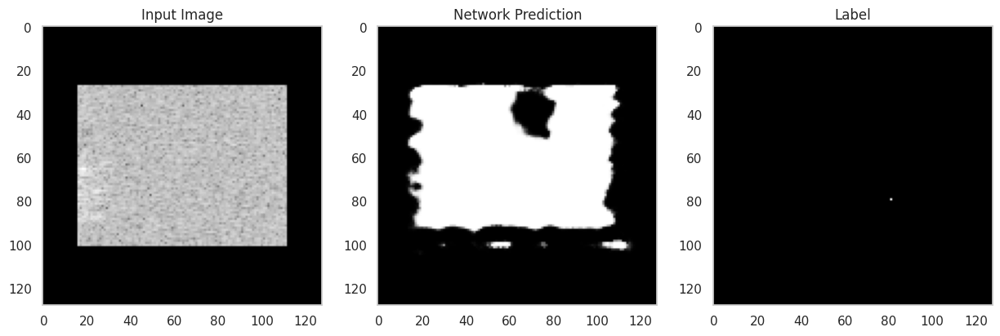

 74%|███████▍  | 298/400 [00:37<00:19,  5.20it/s]

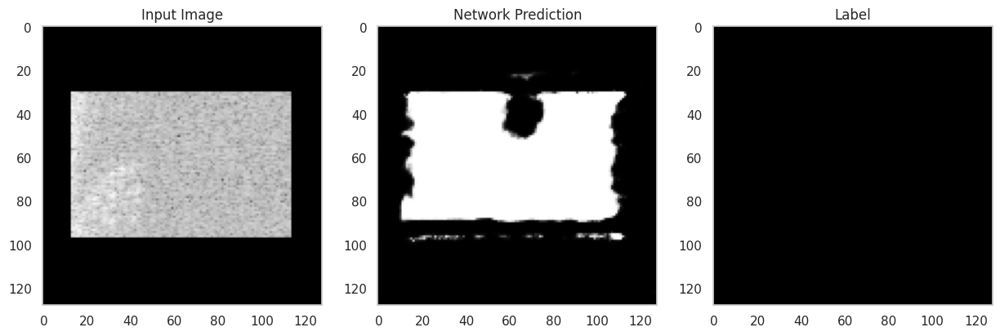

 92%|█████████▏| 367/400 [00:44<00:03, 10.13it/s]

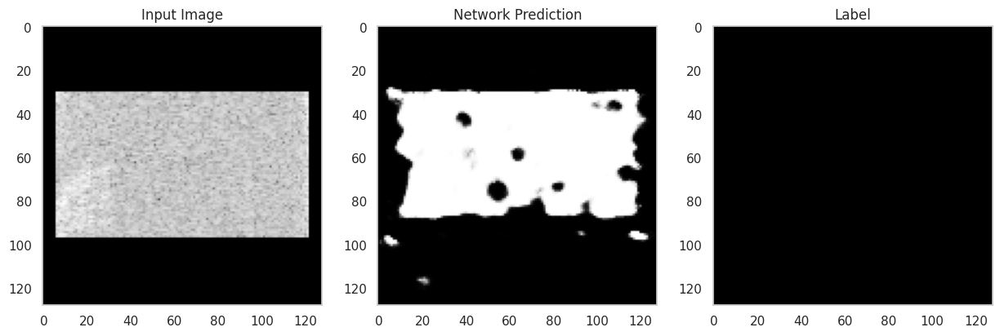

100%|█████████▉| 399/400 [00:48<00:00, 10.30it/s]

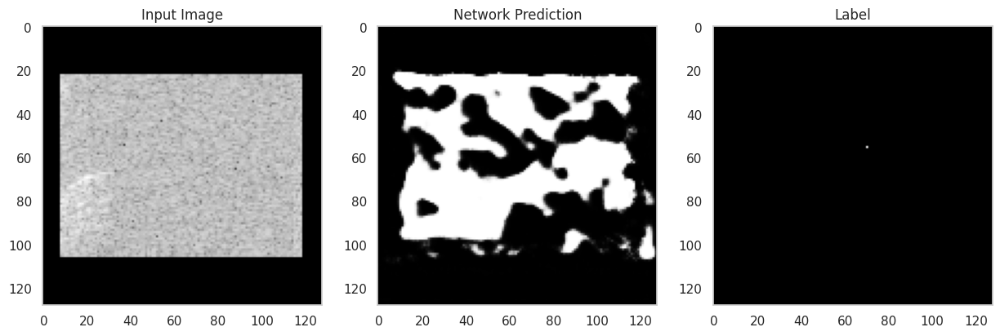

100%|██████████| 400/400 [00:48<00:00,  8.26it/s]


Epoch 10/50, Loss: 0.99986862


  2%|▎         | 10/400 [00:01<00:39,  9.97it/s]

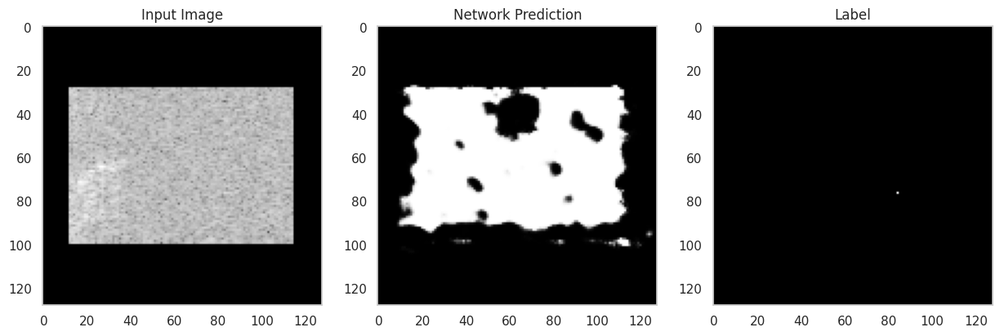

  6%|▋         | 26/400 [00:02<00:38,  9.64it/s]

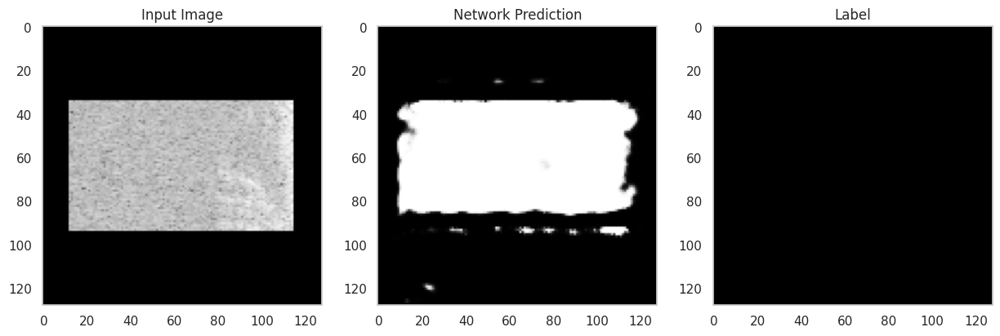

 66%|██████▋   | 265/400 [00:33<00:21,  6.32it/s]

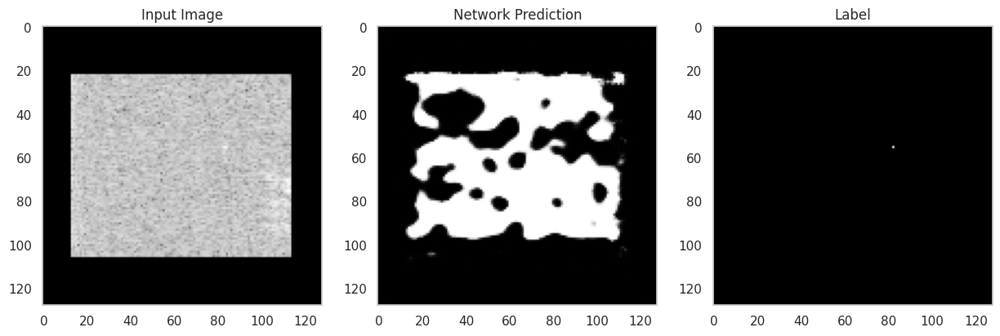

 81%|████████  | 323/400 [00:40<00:07, 10.20it/s]

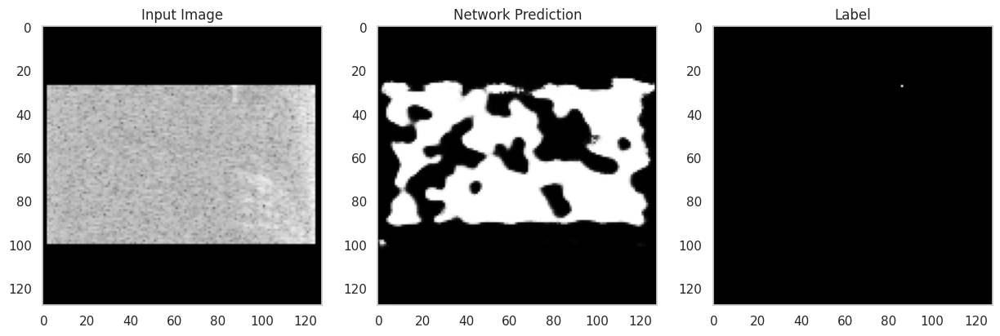

 91%|█████████▏| 365/400 [00:45<00:03,  9.31it/s]

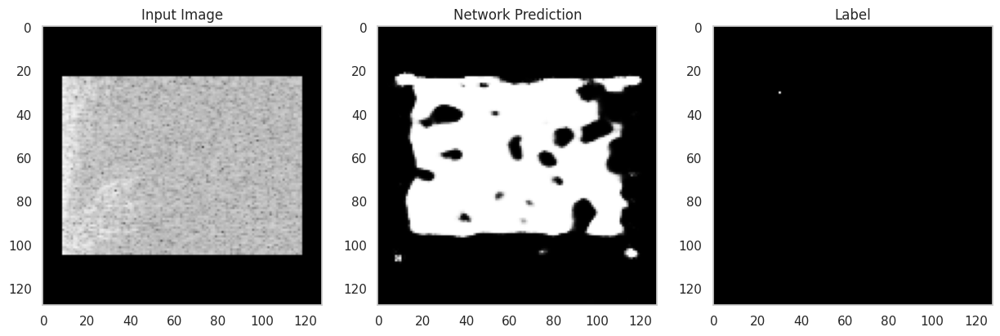

 92%|█████████▏| 367/400 [00:46<00:05,  5.91it/s]

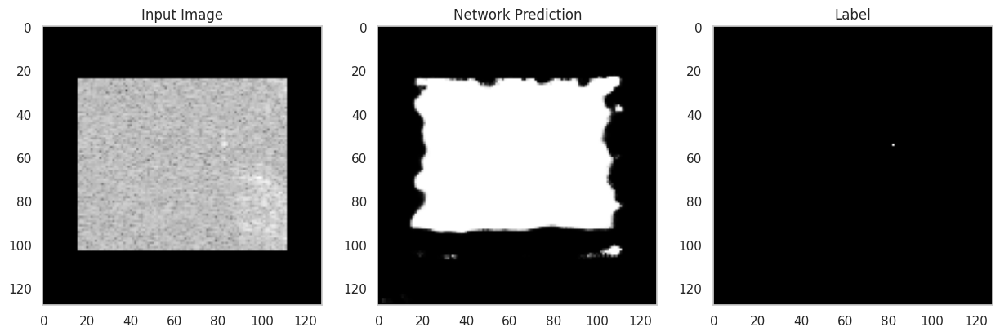

 94%|█████████▍| 375/400 [00:47<00:03,  8.11it/s]

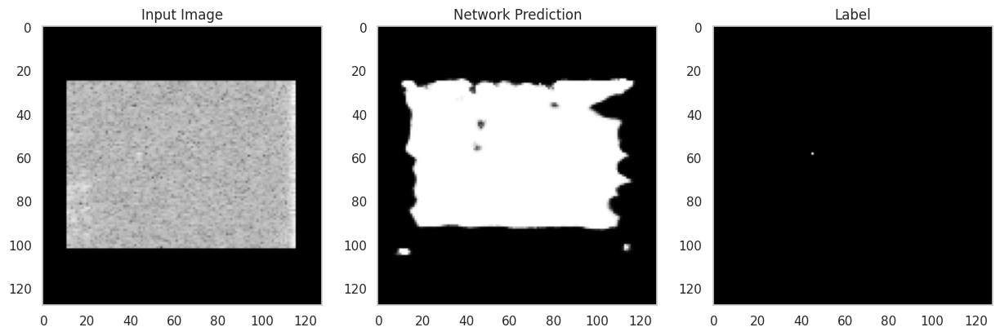

100%|██████████| 400/400 [00:50<00:00,  7.96it/s]


Epoch 11/50, Loss: 0.99986566


 27%|██▋       | 108/400 [00:12<00:32,  8.90it/s]


KeyboardInterrupt: 

In [19]:
import torch
import torch.optim as optim
import torch.nn as nn
from tqdm import tqdm
from search_spaces.radar.radar_dataset import RadarDavaDataset

dataset = RadarDavaDataset(root_dir="../data/radar/mydb/mat", batch_size=4, has_distance=True)
train_loader, val_loader, test_loader = dataset.generate_loaders()

# Train network

# Define Dice Loss
class DiceLoss(nn.Module):
    def __init__(self):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        inputs = torch.sigmoid(inputs)
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)
        return 1 - dice

# Initialize loss function and optimizer
criterion = DiceLoss()
optimizer = optim.Adam(network.parameters(), lr=1e-4)

# Training loop
num_epochs = 50
train_losses = []

for epoch in range(num_epochs):
    network.train()
    running_loss = 0.0
    for inputs, targets in tqdm(train_loader):
        if np.random.randint(50) == 7:
            # Plot one random input, network prediction, and associated label
            random_index = np.random.randint(len(inputs))
            input_image = inputs[random_index]
            target_image = targets[random_index]
            output_image = torch.sigmoid(network(inputs[random_index].to("cuda").unsqueeze(0)))

            f, axarr = plt.subplots(1, 3, figsize=(15, 5))
            axarr[0].imshow(input_image.cpu().numpy().transpose(1, 2, 0), cmap='gray')
            axarr[0].set_title('Input Image')
            axarr[1].imshow(output_image.detach().cpu().numpy().squeeze(), cmap='gray')
            axarr[1].set_title('Network Prediction')
            axarr[2].imshow(target_image.cpu().detach().numpy().squeeze(), cmap='gray')
            axarr[2].set_title('Label')
            axarr[0].grid(False); axarr[1].grid(False); axarr[2].grid(False)

            plt.show()
            plt.close(f)
        inputs, targets = inputs.to("cuda"), targets.to("cuda")
        optimizer.zero_grad()
        outputs = network(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)

    epoch_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_loss)
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.8f}")

# Save the loss at each epoch
with open('train_losses.txt', 'w') as f:
    for loss in train_losses:
        f.write(f"{loss}\n")
